# Roget's Thesaurus (Embedding's Class Prediction)

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2024 <br>

## 1. About the notebook
---

The purpose of this notebook is to performe a part of the hole project (<b>Roget's Thesaurus in the 21st Century</b>) which is the class prediction of the embeddings we created in notebook <b>Roget's Data and Embeddings</b>

This Jupyter Notebook is focused on the application of machine learning and deep learning models to predict the categories of word embeddings previously generated from textual data extracted from Gutenberg's website.

## 2. Libraries

In [1]:
# Data Loading, Manipulation and Normalization
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from keras.utils import to_categorical

# Vector DB and Dimensionality Reduction
import faiss
from umap import UMAP

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank

# Split and Reports
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Machine Learning Models and Ensemble Models
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Model validation and Hyperparameter tuning
from sklearn.model_selection import cross_val_score
import optuna

# Save the model
from joblib import dump

# Deep learning
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Reshape, Dense, LSTM, GRU, Bidirectional
from tensorflow.keras.layers import LayerNormalization, Add, Dropout, BatchNormalization

# Mixed Presicion
from tensorflow.keras import mixed_precision

# Callbacks and Regularization
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# Visualize the model's architecture
from keras.utils import plot_model

# Helper functions
import helper_functions as hf

2024-09-16 22:58:47.064264: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-16 22:58:47.091388: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-16 22:58:47.091406: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-16 22:58:47.092620: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-16 22:58:47.098508: I tensorflow/core/platform/cpu_feature_guar

In [2]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", category=ConvergenceWarning)

## 3. Data loading and Preparation

### Words Loading

* Loading the word along with the classes and the embeddings

In [3]:
roget_words = pd.read_csv("Dataset/Roget's_Words.csv")
print(roget_words.shape)
roget_words.head()

(94214, 7)


,Class,Division,Section,Category,Sub-Category,Word,Final_Words
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,existence,"Existence, existence"
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,being,"Existence, being"
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,entity,"Existence, entity"
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,ens,"Existence, ens"
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,esse,"Existence, esse"


### VectorDB's Embeddings

* Retrieve the vectorDBs and the parameters

In [4]:
index_st = faiss.read_index('Embeddings/ST_vectordb.faiss')
index_use = faiss.read_index('Embeddings/USE_vectordb.faiss')
index_gemma2b = faiss.read_index('Embeddings/Gemma1.1_2B_vectordb.faiss')
index_gemma7b = faiss.read_index('Embeddings/Gemma1.1_7B_vectordb.faiss')

In [5]:
index_st.ntotal, index_use.ntotal, index_gemma2b.ntotal, index_gemma7b.ntotal

(94214, 94214, 94214, 94214)

In [6]:
d_st = index_st.d
d_use = index_use.d
d_gemma2b = index_gemma2b.d
d_gemma7b = index_gemma7b.d

d_st, d_use, d_gemma2b, d_gemma7b

(384, 512, 2048, 3072)

* Retrieve the embeddings

In [7]:
embeddings_st = np.zeros((index_st.ntotal, d_st), dtype=np.float32)
embeddings_use = np.zeros((index_use.ntotal, d_use), dtype=np.float32)
embeddings_gemma2b = np.zeros((index_gemma2b.ntotal, d_gemma2b), dtype=np.float32)
embeddings_gemma7b = np.zeros((index_gemma7b.ntotal, d_gemma7b), dtype=np.float32)

In [8]:
for i in range(index_st.ntotal):
    embeddings_st[i] = index_st.reconstruct(i)
    embeddings_use[i] = index_use.reconstruct(i)
    embeddings_gemma2b[i] = index_gemma2b.reconstruct(i)
    embeddings_gemma7b[i] = index_gemma7b.reconstruct(i)

In [9]:
scaler = StandardScaler()

embeddings_st = scaler.fit_transform(embeddings_st)
embeddings_use = scaler.fit_transform(embeddings_use)
embeddings_gemma2b = scaler.fit_transform(embeddings_gemma2b)
embeddings_gemma7b = scaler.fit_transform(embeddings_gemma7b)

In [10]:
embeddings_st = pd.DataFrame(embeddings_st)
embeddings_use = pd.DataFrame(embeddings_use)
embeddings_gemma2b = pd.DataFrame(embeddings_gemma2b)
embeddings_gemma7b = pd.DataFrame(embeddings_gemma7b)

## 4. Machine Learning

Seven different models where chosen in the class prediction notebook where with all these model we will follow a specific pattern to find the best parameters and optimize the accuracy. The pattern is the following:

First I initialize the model without parameters in order to see the score it can hit without any optimization. Then we will use the optuna to modify some of the parameters and find the best combination. If the optuna goes better than the befault then we will take the parameters of the best trial that optuna had and train a model with this parameters. The best model that we will save will be the model with the highest score.

In [11]:
umap = UMAP(n_components=300, n_jobs=-1)
X = umap.fit_transform(embeddings_gemma7b)

y = roget_words['Class']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=33)

### SGD

In [13]:
sgd = SGDClassifier(random_state=33)
sgd.fit(X_train, y_train)

SGDClassifier(random_state=33)

In [14]:
sgd.score(X_test, y_test)

0.8562886962674686

In [15]:
print(classification_report(y_test, sgd.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.84      0.81      0.82      4317
                         CLASS II WORDS RELATING TO SPACE       0.97      0.77      0.86      3819
                       CLASS III WORDS RELATING TO MATTER       0.96      0.86      0.91      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.90      0.81      0.86      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.76      0.92      0.83      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.87      0.90      0.89      5756

                                                 accuracy                           0.86     28265
                                                macro avg       0.88      0.85      0.86     28265
                                             weighted avg       0.87      0.86      0.86     28265



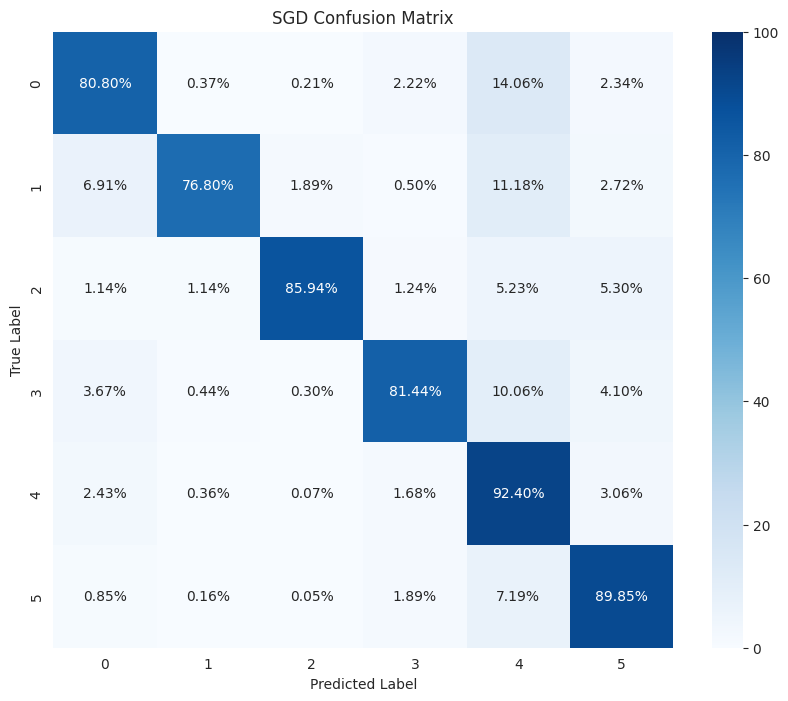

In [16]:
hf.confusion_matrix_plot(y_test, sgd.predict(X_test), 'SGD', 'Class/SGD_cm')

In [17]:
def objective_sgd_class(trial):

    params = {
        'alpha': trial.suggest_float('alpha', 0.01, 1),
        'epsilon': trial.suggest_float('epsilon', 0.01, 1),
        'l1_ratio': trial.suggest_float('l1_ratio', 0.01, 1),
        'penalty': trial.suggest_categorical('penalty', [None, 'l1', 'l2']),
        'warm_start': trial.suggest_categorical('warm_start', [True, False]),
        'max_iter': trial.suggest_int('max_iter', 50, 250),
        'random_state': 33
    }
    
    sgd = SGDClassifier(**params)

    score = cross_val_score(sgd, X_train, y_train.to_numpy(), cv=5, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [18]:
study_sgd = optuna.create_study(direction="maximize")
study_sgd.optimize(objective_sgd_class, n_trials=30, n_jobs=-1)

[I 2024-09-16 23:08:48,315] A new study created in memory with name: no-name-3183757f-091f-4c39-9afb-e5633fe91c4c
[I 2024-09-16 23:08:53,166] Trial 1 finished with value: 0.7251512681640012 and parameters: {'alpha': 0.5694065673051315, 'epsilon': 0.5864991716374252, 'l1_ratio': 0.1469731289919768, 'penalty': 'l2', 'warm_start': True, 'max_iter': 241}. Best is trial 1 with value: 0.7251512681640012.
[I 2024-09-16 23:08:54,795] Trial 0 finished with value: 0.7514595795161163 and parameters: {'alpha': 0.12309419849266985, 'epsilon': 0.5031972018486607, 'l1_ratio': 0.028410831421098875, 'penalty': 'l2', 'warm_start': True, 'max_iter': 220}. Best is trial 0 with value: 0.7514595795161163.
[I 2024-09-16 23:08:54,969] Trial 2 finished with value: 0.20618852259944376 and parameters: {'alpha': 0.25400159037829323, 'epsilon': 0.1907955702234779, 'l1_ratio': 0.48287721351309126, 'penalty': 'l1', 'warm_start': True, 'max_iter': 179}. Best is trial 0 with value: 0.7514595795161163.
[I 2024-09-16 23

In [19]:
print('Best trial:')
trial = study_sgd.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.7759327077248823
Params: 
  alpha: 0.02085825216159272
  epsilon: 0.5085680878044441
  l1_ratio: 0.03838794737739498
  penalty: l2
  warm_start: True
  max_iter: 153


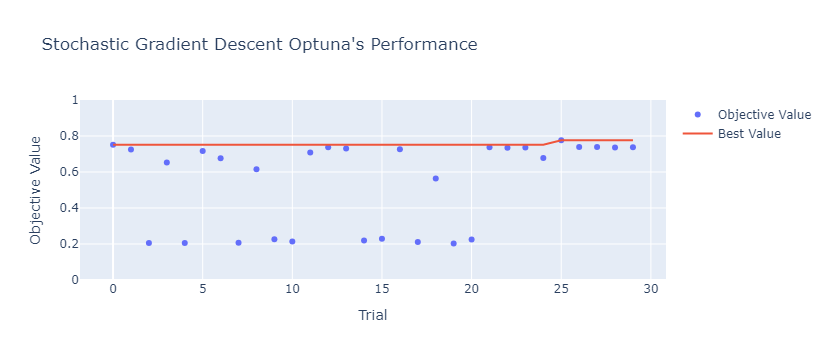

In [20]:
fig = plot_optimization_history(study_sgd)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent Optuna's Performance")
fig.show()

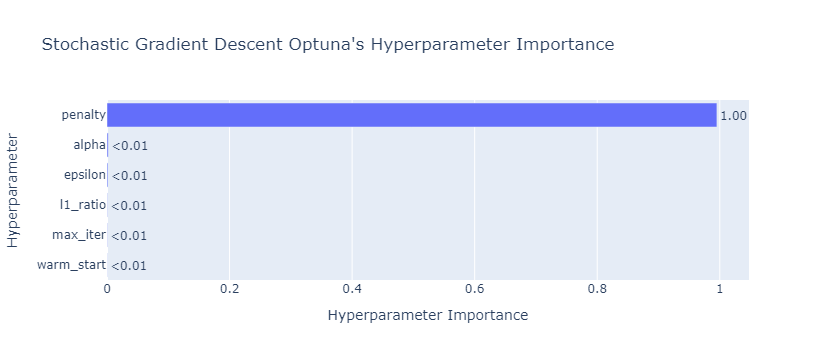

In [21]:
fig = plot_param_importances(study_sgd)

fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparameter Importance")
fig.show()

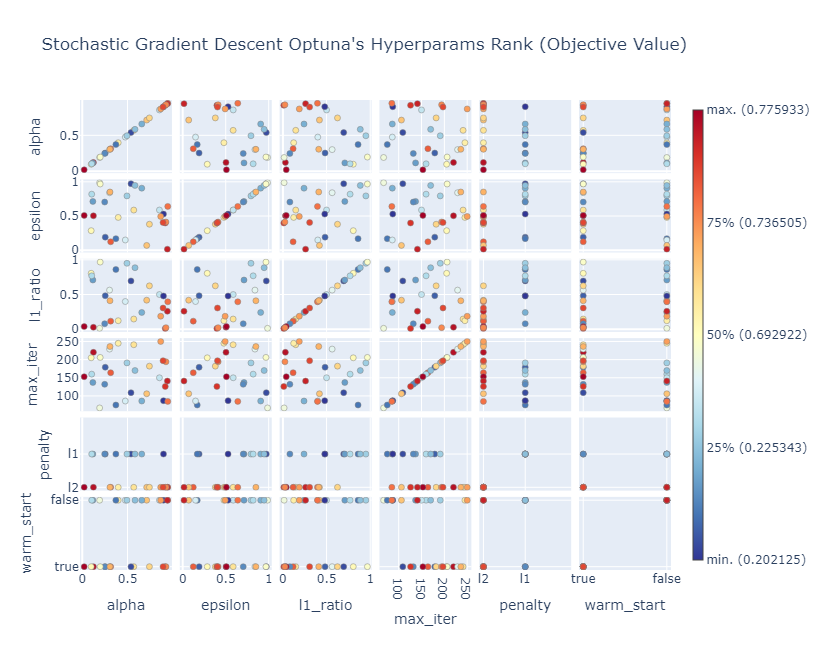

In [22]:
fig = plot_rank(study_sgd)
fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparams Rank (Objective Value)", width=930, height=650)
fig.show()

In [23]:
sgd_class = SGDClassifier(**trial.params, random_state=33)
sgd_class.fit(X_train, y_train)

SGDClassifier(alpha=0.02085825216159272, epsilon=0.5085680878044441,
              l1_ratio=0.03838794737739498, max_iter=153, random_state=33,
              warm_start=True)

In [24]:
sgd_class.score(X_test, y_test)

0.7719087210330797

In [25]:
print(classification_report(y_test, sgd_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.88      0.63      0.73      4317
                         CLASS II WORDS RELATING TO SPACE       0.78      0.79      0.78      3819
                       CLASS III WORDS RELATING TO MATTER       0.57      0.84      0.68      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.75      0.77      0.76      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.78      0.82      0.80      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.89      0.77      0.82      5756

                                                 accuracy                           0.77     28265
                                                macro avg       0.77      0.77      0.76     28265
                                             weighted avg       0.79      0.77      0.77     28265



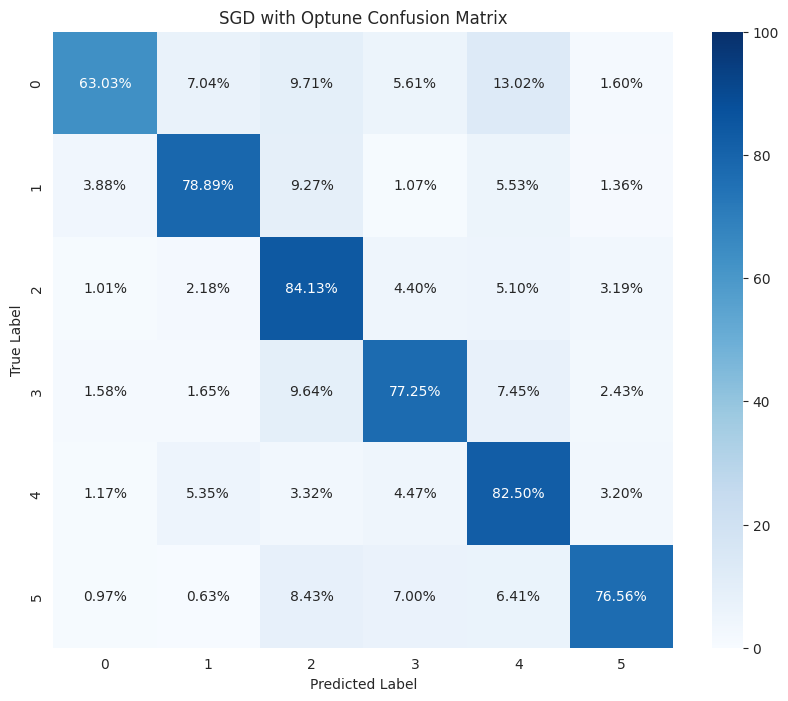

In [26]:
hf.confusion_matrix_plot(y_test, sgd_class.predict(X_test), 'SGD with Optune', 'Class/SGD_cm_optuna')

### SVC

In [27]:
svc = SVC(max_iter=150, random_state=33)
svc.fit(X_train, y_train)

SVC(max_iter=150, random_state=33)

In [28]:
svc.score(X_test, y_test)

0.3609764726693791

In [29]:
print(classification_report(y_test, svc.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.23      0.62      0.34      4317
                         CLASS II WORDS RELATING TO SPACE       0.38      0.16      0.23      3819
                       CLASS III WORDS RELATING TO MATTER       0.45      0.31      0.37      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.55      0.38      0.45      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.53      0.15      0.24      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.40      0.57      0.47      5756

                                                 accuracy                           0.36     28265
                                                macro avg       0.42      0.37      0.35     28265
                                             weighted avg       0.43      0.36      0.35     28265



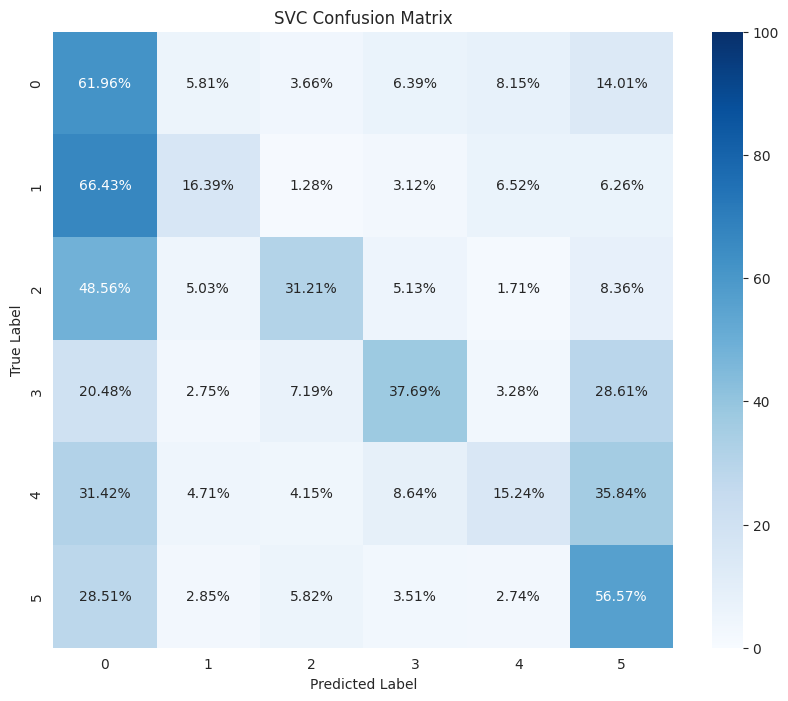

In [30]:
hf.confusion_matrix_plot(y_test, svc.predict(X_test), 'SVC', 'Class/SVC_cm')

In [31]:
def objective_svc_class(trial):
    params = {
        'C': trial.suggest_float('C', 0.01, 1),
        'kernel': trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf']),
        'gamma': trial.suggest_categorical('gamma', ['scale', 'auto']),
        'degree': trial.suggest_int('degree', 2, 6),
        'max_iter': 150,
        'random_state': 33
    }
    
    svc = SVC(**params)

    score = cross_val_score(svc, X_train, y_train.to_numpy(), scoring='accuracy', n_jobs=-1)
    return score.mean()

In [33]:
study_svc = optuna.create_study(direction="maximize")
study_svc.optimize(objective_svc_class, n_trials=30)

[I 2024-09-16 23:14:15,315] A new study created in memory with name: no-name-ad9d66f5-e127-4c3b-bc81-baf4d65a1dca
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing yo

In [34]:
print('Best trial:')
trial = study_svc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.4796429353820306
Params: 
  C: 0.6284736558825147
  kernel: linear
  gamma: auto
  degree: 5


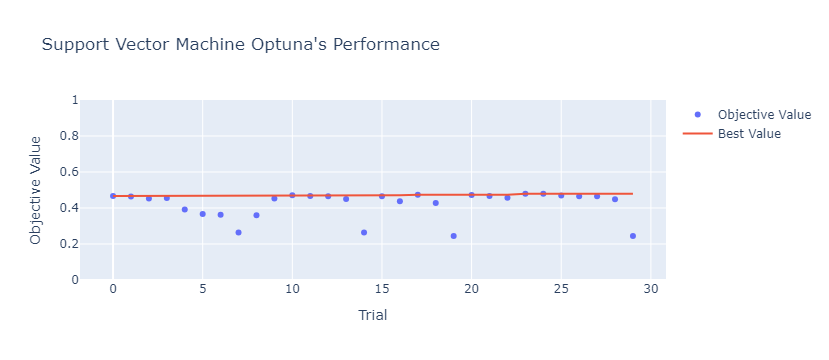

In [35]:
fig = plot_optimization_history(study_svc)

fig.update_layout(yaxis_range=[0, 1], title="Support Vector Machine Optuna's Performance")
fig.show()

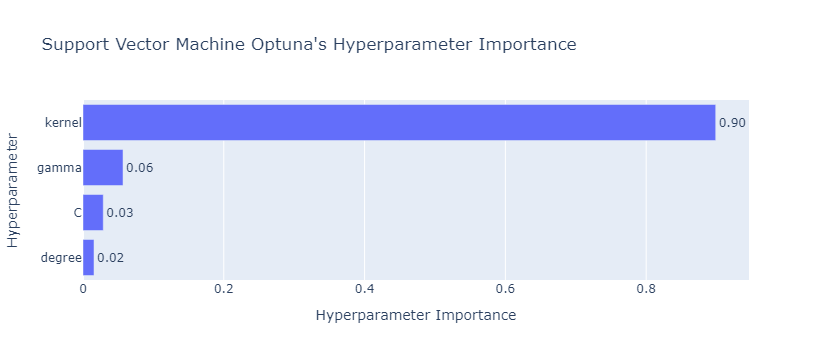

In [36]:
fig = plot_param_importances(study_svc)

fig.update_layout(title="Support Vector Machine Optuna's Hyperparameter Importance")
fig.show()

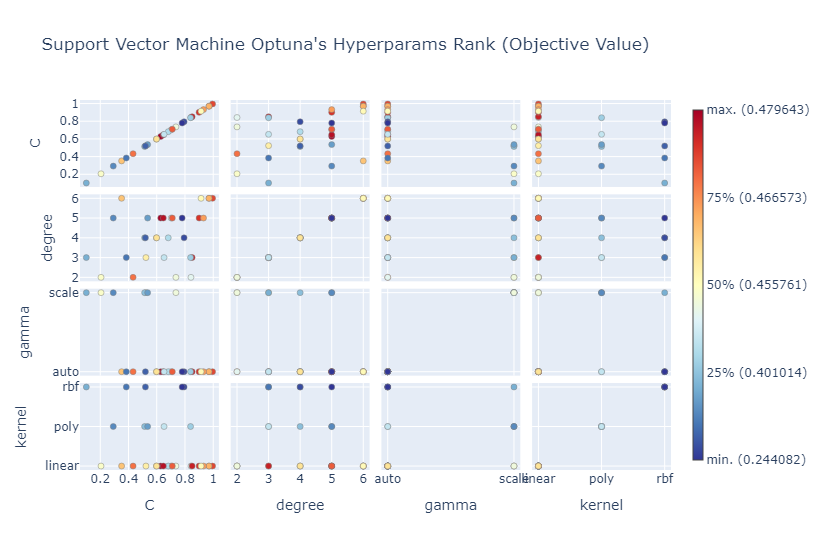

In [37]:
fig = plot_rank(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [38]:
svc_class = SVC(**study_svc.best_trial.params, max_iter=150, random_state=33)
svc_class.fit(X_train, y_train)

SVC(C=0.6284736558825147, degree=5, gamma='auto', kernel='linear', max_iter=150,
    random_state=33)

In [39]:
svc_class.score(X_test, y_test)

0.4402264284450734

In [40]:
print(classification_report(y_test, svc_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.45      0.19      0.26      4317
                         CLASS II WORDS RELATING TO SPACE       0.49      0.29      0.37      3819
                       CLASS III WORDS RELATING TO MATTER       0.43      0.20      0.27      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.48      0.38      0.43      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.48      0.48      0.48      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.40      0.84      0.54      5756

                                                 accuracy                           0.44     28265
                                                macro avg       0.45      0.40      0.39     28265
                                             weighted avg       0.45      0.44      0.41     28265



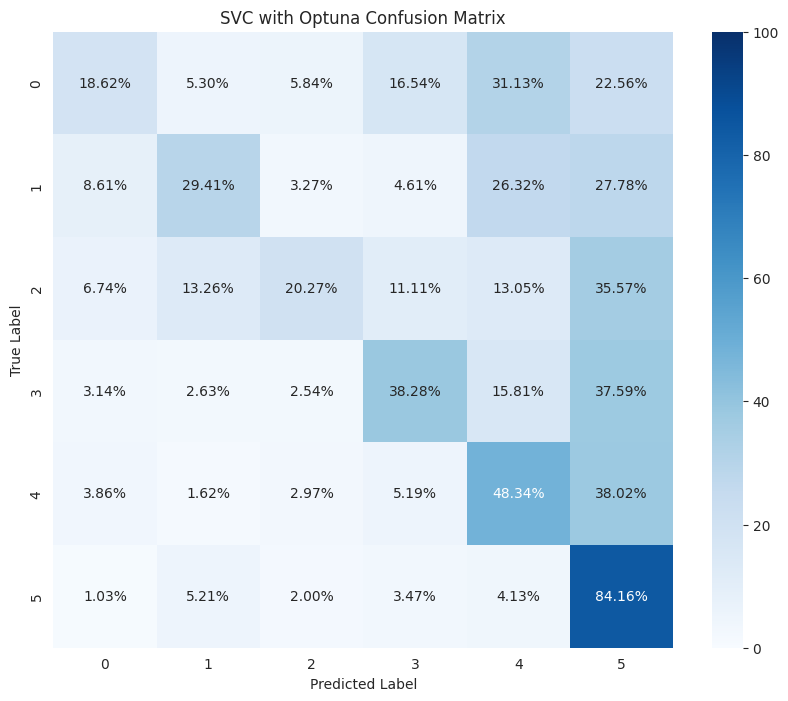

In [41]:
hf.confusion_matrix_plot(y_test, svc_class.predict(X_test), 'SVC with Optuna', 'Class/SVC_cm_optuna')

### Random Forest

In [42]:
rf = RandomForestClassifier(random_state=33)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=33)

In [43]:
rf.score(X_test, y_test)

0.9745975588183265

In [44]:
print(classification_report(y_test, rf.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.97      0.96      0.97      4317
                         CLASS II WORDS RELATING TO SPACE       0.98      0.97      0.98      3819
                       CLASS III WORDS RELATING TO MATTER       0.97      0.97      0.97      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.98      0.98      0.98      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.97      0.98      0.97      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.98      0.98      0.98      5756

                                                 accuracy                           0.97     28265
                                                macro avg       0.97      0.97      0.97     28265
                                             weighted avg       0.97      0.97      0.97     28265



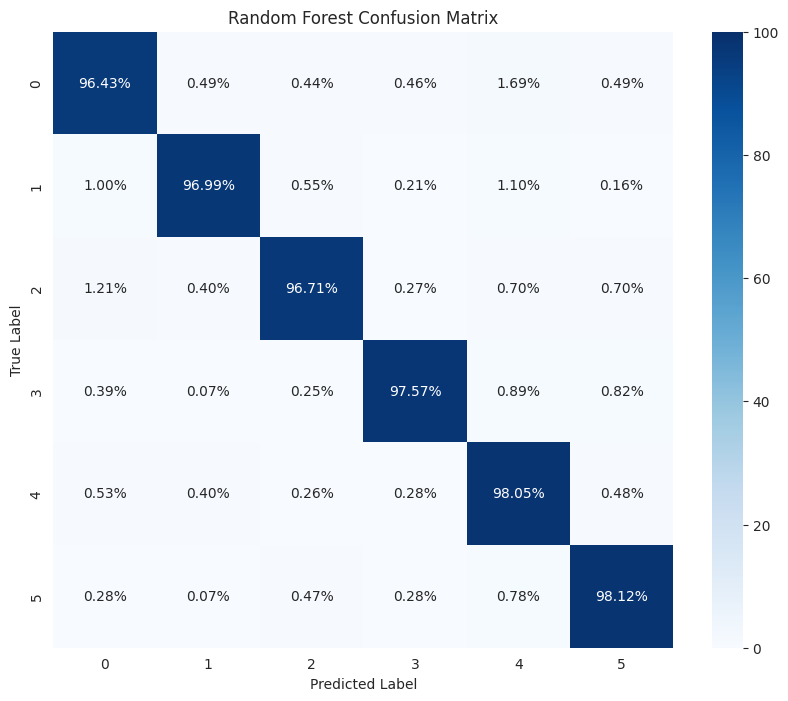

In [45]:
hf.confusion_matrix_plot(y_test, rf.predict(X_test), 'Random Forest', 'Class/RF_cm')

In [46]:
def objective_rf_class(trial):

    params = {
        'n_estimators': trial.suggest_int('n_estimators', low=50, high=250, step=50),
        'max_depth': trial.suggest_int('max_depth', 1, 25),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'n_jobs': -1,
        'random_state': 33
    }
    
    rfc_optuna = RandomForestClassifier(**params)

    score = cross_val_score(rfc_optuna, X_train, y_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [47]:
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf_class, n_trials=15)

[I 2024-09-16 23:26:29,237] A new study created in memory with name: no-name-73e773be-b7c7-4ed4-9510-08b18e22986d
[I 2024-09-16 23:27:48,444] Trial 0 finished with value: 0.968445300207958 and parameters: {'n_estimators': 200, 'max_depth': 16, 'min_samples_split': 6, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 0.968445300207958.
[I 2024-09-16 23:28:25,721] Trial 1 finished with value: 0.9722512896570883 and parameters: {'n_estimators': 150, 'max_depth': 21, 'min_samples_split': 2, 'min_samples_leaf': 1, 'bootstrap': True}. Best is trial 1 with value: 0.9722512896570883.
[I 2024-09-16 23:28:45,309] Trial 2 finished with value: 0.9696583610839806 and parameters: {'n_estimators': 50, 'max_depth': 18, 'min_samples_split': 10, 'min_samples_leaf': 1, 'bootstrap': False}. Best is trial 1 with value: 0.9722512896570883.
[I 2024-09-16 23:29:00,177] Trial 3 finished with value: 0.858147991431047 and parameters: {'n_estimators': 100, 'max_depth': 7, 'min_samples_split'

In [48]:
print('Best trial:')
trial = study_rf.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9722512896570883
Params: 
  n_estimators: 150
  max_depth: 21
  min_samples_split: 2
  min_samples_leaf: 1
  bootstrap: True


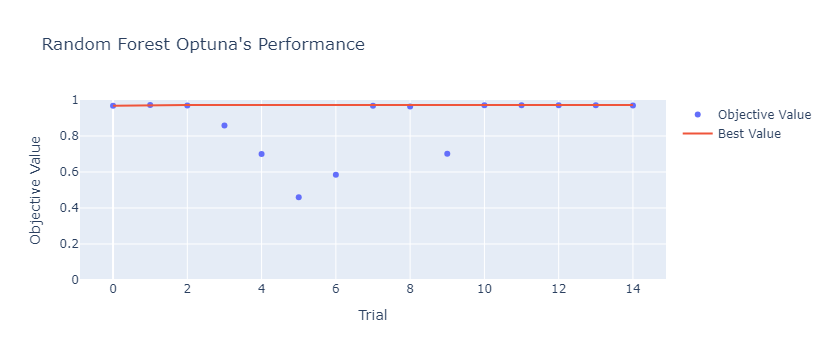

In [49]:
fig = plot_optimization_history(study_rf)

fig.update_layout(yaxis_range=[0, 1], title="Random Forest Optuna's Performance")
fig.show()

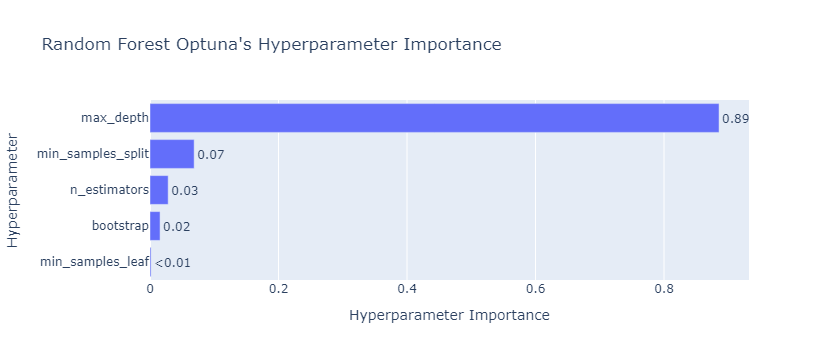

In [50]:
fig = plot_param_importances(study_rf)

fig.update_layout(title="Random Forest Optuna's Hyperparameter Importance")
fig.show()

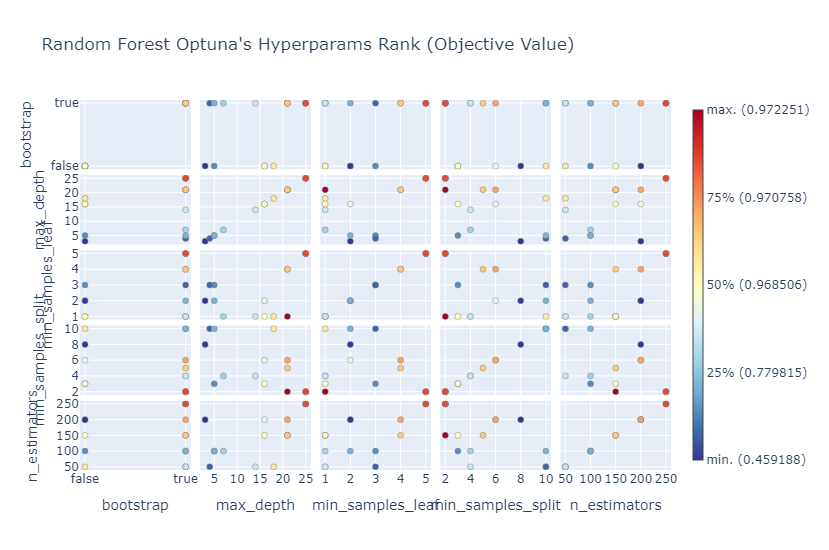

In [51]:
fig = plot_rank(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [52]:
rf_class = RandomForestClassifier(**study_rf.best_trial.params, random_state=33, n_jobs=-1)
rf_class.fit(X_train, y_train)

RandomForestClassifier(max_depth=21, n_estimators=150, n_jobs=-1,
                       random_state=33)

In [53]:
rf_class.score(X_test, y_test)

0.9734300371484168

In [54]:
print(classification_report(y_test, rf_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.97      0.96      0.97      4317
                         CLASS II WORDS RELATING TO SPACE       0.99      0.97      0.98      3819
                       CLASS III WORDS RELATING TO MATTER       0.97      0.97      0.97      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.99      0.97      0.98      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.96      0.98      0.97      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.98      0.98      0.98      5756

                                                 accuracy                           0.97     28265
                                                macro avg       0.97      0.97      0.97     28265
                                             weighted avg       0.97      0.97      0.97     28265



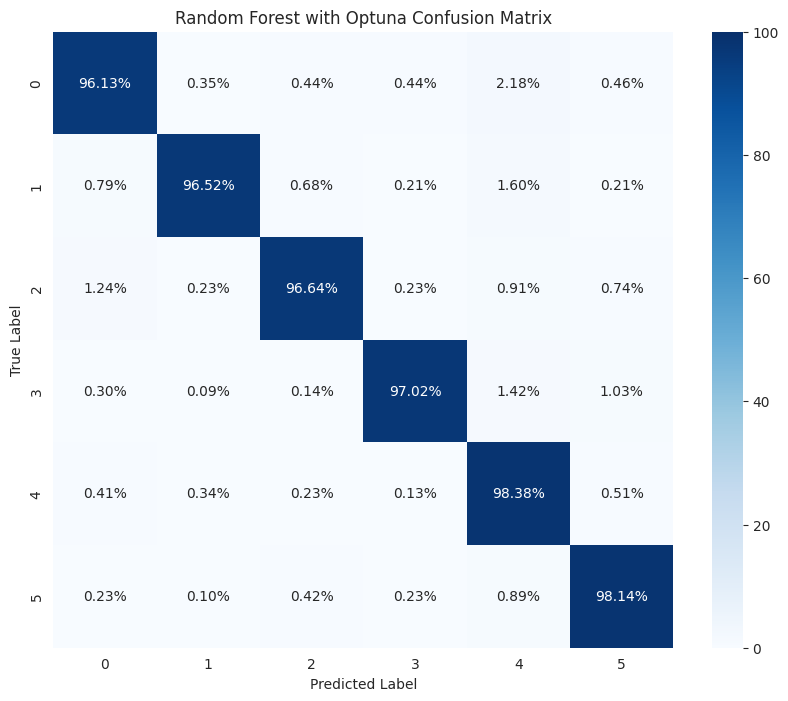

In [55]:
hf.confusion_matrix_plot(y_test, rf_class.predict(X_test), 'Random Forest with Optuna', 'Class/RF_cm_optuna')

### AdaBoost

In [56]:
adaboost = AdaBoostClassifier(random_state=33)
adaboost.fit(X_train, y_train)

AdaBoostClassifier(random_state=33)

In [57]:
adaboost.score(X_test, y_test)

0.5323191225897753

In [58]:
print(classification_report(y_test, adaboost.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.40      0.32      0.36      4317
                         CLASS II WORDS RELATING TO SPACE       0.56      0.54      0.55      3819
                       CLASS III WORDS RELATING TO MATTER       0.55      0.43      0.49      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.63      0.49      0.55      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.48      0.61      0.54      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.60      0.68      0.63      5756

                                                 accuracy                           0.53     28265
                                                macro avg       0.54      0.51      0.52     28265
                                             weighted avg       0.53      0.53      0.53     28265



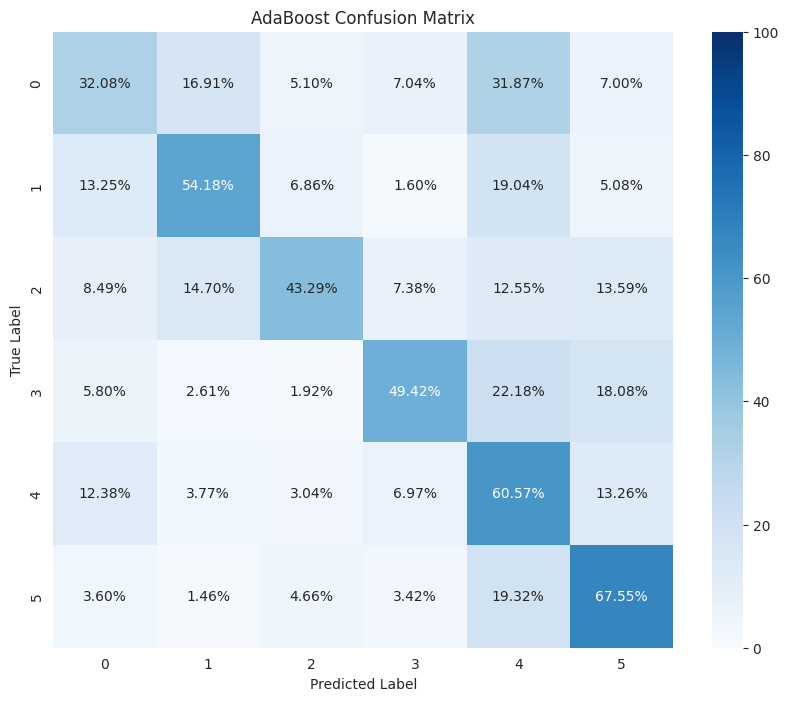

In [59]:
hf.confusion_matrix_plot(y_test, adaboost.predict(X_test), 'AdaBoost', 'Class/AdaBoost_cm')

In [60]:
def objective_ada_class(trial):
    params_estimator = {
        'max_depth': trial.suggest_int('max_depth', 1, 15),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 15),
        'max_features': trial.suggest_int('max_features', 20, 50),
        'random_state': 33        
    }

    estimator = DecisionTreeClassifier(**params_estimator)
    
    params = {
        'estimator': estimator,
        'n_estimators': trial.suggest_int('n_estimators', 50, 150, step=25),
        'algorithm': 'SAMME',
        # 'learning_rate': trial.suggest_float('learning_rate', .01, .05),
        'random_state': 33
    }
    adaboost = AdaBoostClassifier(**params)
    
    score = cross_val_score(adaboost,
                            X_train,
                            y_train,
                            scoring='accuracy',
                            cv=3,
                            n_jobs=-1)

    return score.mean()

In [61]:
study_adaboost = optuna.create_study(direction='maximize')
study_adaboost.optimize(objective_ada_class, n_trials=10)

[I 2024-09-16 23:44:41,037] A new study created in memory with name: no-name-c968aabc-8410-4895-bddf-06b058f426dc
[I 2024-09-16 23:46:59,735] Trial 0 finished with value: 0.9717963881180912 and parameters: {'max_depth': 14, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 45, 'n_estimators': 75}. Best is trial 0 with value: 0.9717963881180912.
[I 2024-09-16 23:48:56,228] Trial 1 finished with value: 0.9700677796479097 and parameters: {'max_depth': 8, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 25, 'n_estimators': 150}. Best is trial 0 with value: 0.9717963881180912.
[I 2024-09-16 23:49:51,096] Trial 2 finished with value: 0.9613034314394456 and parameters: {'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 39, 'n_estimators': 50}. Best is trial 0 with value: 0.9717963881180912.
[I 2024-09-16 23:51:54,774] Trial 3 finished with value: 0.9714931234741998 and parameters: {'max_depth': 13, 'min_samples_split': 3, 'min_samples_le

In [62]:
print('Best trial:')
trial = study_adaboost.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9719176939756479
Params: 
  max_depth: 15
  min_samples_split: 2
  min_samples_leaf: 4
  max_features: 37
  n_estimators: 125


In [63]:
trials_df = study_adaboost.trials_dataframe()
trials_df.sort_values(by='value', ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_n_estimators,state
7,7,0.971918,2024-09-16 23:57:18.760982,2024-09-17 00:00:31.876542,0 days 00:03:13.115560,15,37,4,2,125,COMPLETE
0,0,0.971796,2024-09-16 23:44:41.038171,2024-09-16 23:46:59.735381,0 days 00:02:18.697210,14,45,4,4,75,COMPLETE
6,6,0.971736,2024-09-16 23:55:23.181461,2024-09-16 23:57:18.759833,0 days 00:01:55.578372,14,28,1,4,100,COMPLETE
3,3,0.971493,2024-09-16 23:49:51.097131,2024-09-16 23:51:54.773788,0 days 00:02:03.676657,13,20,6,3,150,COMPLETE
8,8,0.970310,2024-09-17 00:00:31.877429,2024-09-17 00:03:23.731440,0 days 00:02:51.854011,8,37,10,3,150,COMPLETE
1,1,0.970068,2024-09-16 23:46:59.737116,2024-09-16 23:48:56.228744,0 days 00:01:56.491628,8,25,8,2,150,COMPLETE
5,5,0.970053,2024-09-16 23:52:20.338376,2024-09-16 23:55:23.180162,0 days 00:03:02.841786,8,40,8,3,150,COMPLETE
2,2,0.961303,2024-09-16 23:48:56.229871,2024-09-16 23:49:51.096296,0 days 00:00:54.866425,7,39,5,3,50,COMPLETE
9,9,0.958877,2024-09-17 00:03:23.732766,2024-09-17 00:04:43.334866,0 days 00:01:19.602100,6,25,2,2,125,COMPLETE
4,4,0.723635,2024-09-16 23:51:54.774999,2024-09-16 23:52:20.337302,0 days 00:00:25.562303,3,35,1,4,50,COMPLETE


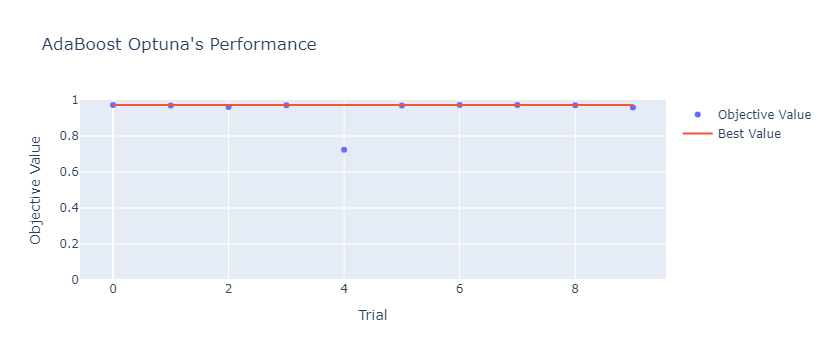

In [64]:
fig = plot_optimization_history(study_adaboost)
fig.update_layout(yaxis_range=[0, 1], title="AdaBoost Optuna's Performance")
fig.show()

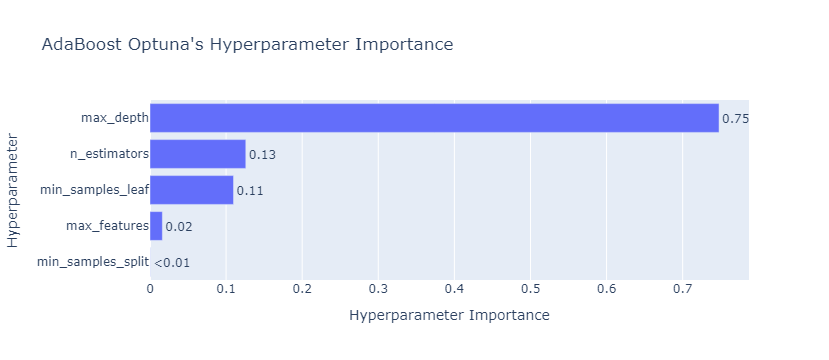

In [65]:
fig = plot_param_importances(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparameter Importance", height=500)
fig.show()

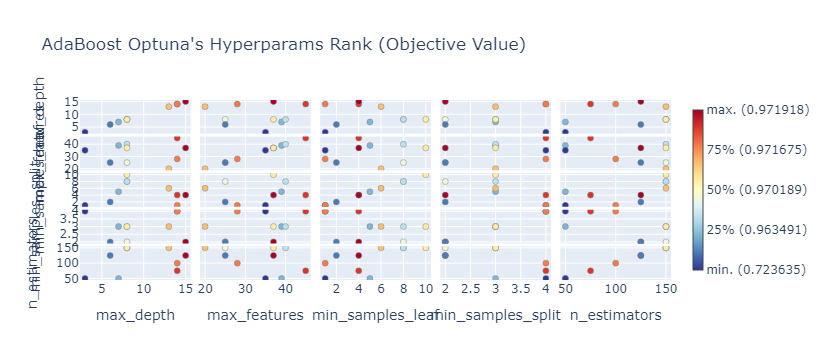

In [66]:
fig = plot_rank(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparams Rank (Objective Value)", height=850)
fig.show()

In [68]:
params_estimator = {
        'max_depth': None,
        'min_samples_split': None,
        'min_samples_leaf': None,
        'max_features': None,
        'random_state': 33        
}

params = {
    'estimator': None,
    'n_estimators': None,
    'algorithm': 'SAMME',
    'random_state': 33
}
for i, key in enumerate(trial.params.items()):
    if i < 4:
        params_estimator[key[0]] = key[1]
    else:
        params[key[0]] = key[1]

In [69]:
estimator = DecisionTreeClassifier(**params_estimator)
params['estimator'] = estimator

adaboost_class = AdaBoostClassifier(**params)
adaboost_class.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=15,
                                                    max_features=37,
                                                    min_samples_leaf=4,
                                                    random_state=33),
                   n_estimators=125, random_state=33)

In [70]:
adaboost_class.score(X_test, y_test)

0.9743145232619848

In [71]:
print(classification_report(y_test, adaboost_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.97      0.97      0.97      4317
                         CLASS II WORDS RELATING TO SPACE       0.98      0.97      0.98      3819
                       CLASS III WORDS RELATING TO MATTER       0.98      0.96      0.97      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.98      0.98      0.98      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.96      0.98      0.97      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.98      0.98      0.98      5756

                                                 accuracy                           0.97     28265
                                                macro avg       0.98      0.97      0.97     28265
                                             weighted avg       0.97      0.97      0.97     28265



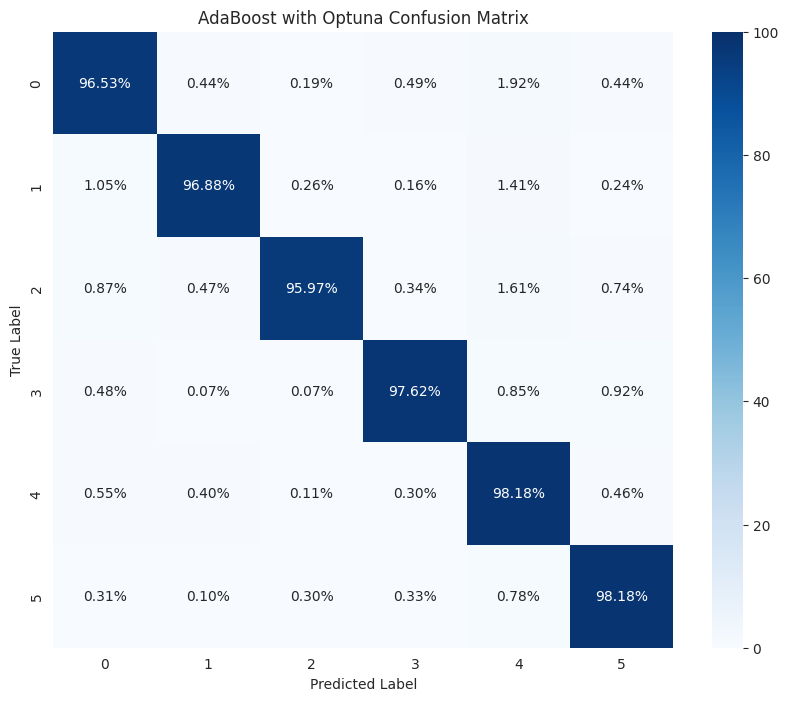

In [72]:
hf.confusion_matrix_plot(y_test, adaboost_class.predict(X_test), 'AdaBoost with Optuna', 'Class/AdaBoost_cm_optuna')

### Extra Trees

In [73]:
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

ExtraTreesClassifier()

In [74]:
etc.score(X_test, y_test)

0.9752697682646383

In [75]:
print(classification_report(y_test, etc.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.97      0.97      0.97      4317
                         CLASS II WORDS RELATING TO SPACE       0.98      0.97      0.98      3819
                       CLASS III WORDS RELATING TO MATTER       0.97      0.98      0.97      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.98      0.98      0.98      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.97      0.98      0.97      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.98      0.98      0.98      5756

                                                 accuracy                           0.98     28265
                                                macro avg       0.98      0.97      0.97     28265
                                             weighted avg       0.98      0.98      0.98     28265



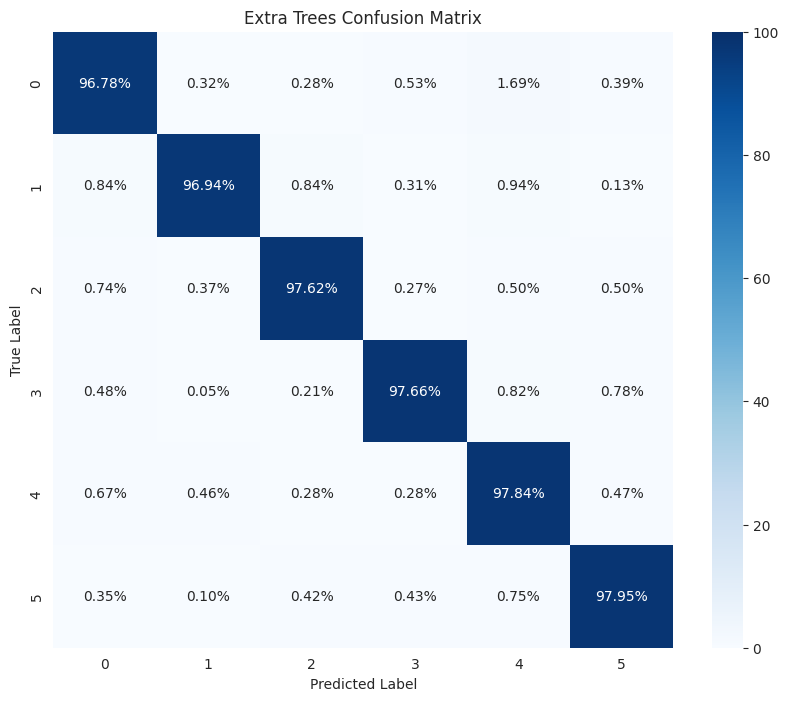

In [76]:
hf.confusion_matrix_plot(y_test, etc.predict(X_test), 'Extra Trees', 'Class/ExtraTrees_cm')

In [77]:
def objective_etc_class(trial):
    max_depth_categ = np.linspace(5, 25, 10).astype(int).tolist()
    max_depth_categ.append(None)

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=25),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'max_depth': trial.suggest_categorical('max_depth', max_depth_categ),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
    }
    etc_optuna = ExtraTreesClassifier(**params)

    score = cross_val_score(etc_optuna, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [78]:
study_etc = optuna.create_study(direction='maximize')
study_etc.optimize(objective_etc_class, n_trials=30)

[I 2024-09-17 00:11:14,607] A new study created in memory with name: no-name-c12d6bc2-4cae-4cd5-9662-d1f82b3f2c49
[I 2024-09-17 00:11:25,117] Trial 0 finished with value: 0.7857738555550501 and parameters: {'n_estimators': 225, 'criterion': 'gini', 'max_depth': 11, 'min_samples_split': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7857738555550501.
[I 2024-09-17 00:11:37,161] Trial 1 finished with value: 0.9727213452819603 and parameters: {'n_estimators': 175, 'criterion': 'log_loss', 'max_depth': None, 'min_samples_split': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9727213452819603.
[I 2024-09-17 00:11:47,678] Trial 2 finished with value: 0.7885335638144627 and parameters: {'n_estimators': 250, 'criterion': 'gini', 'max_depth': 11, 'min_samples_split': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9727213452819603.
[I 2024-09-17 00:11:49,918] Trial 3 finished with value: 0.9004230541782287 and parameters: {'n_estimators': 50, 'criterion': 'gini',

In [79]:
print('Best trial:')
trial = study_etc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9732368951765759
Params: 
  n_estimators: 200
  criterion: log_loss
  max_depth: None
  min_samples_split: 4
  max_features: sqrt


In [80]:
trials_df = study_etc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_criterion,params_max_depth,params_max_features,params_min_samples_split,params_n_estimators,state
23,23,0.973237,2024-09-17 00:14:24.777216,2024-09-17 00:14:38.974634,0 days 00:00:14.197418,log_loss,NaN,sqrt,4,200,COMPLETE
19,19,0.972994,2024-09-17 00:13:37.853960,2024-09-17 00:13:50.059446,0 days 00:00:12.205486,log_loss,NaN,sqrt,3,175,COMPLETE
22,22,0.972918,2024-09-17 00:14:10.851630,2024-09-17 00:14:24.776153,0 days 00:00:13.924523,log_loss,NaN,sqrt,4,200,COMPLETE
21,21,0.972888,2024-09-17 00:13:58.913772,2024-09-17 00:14:10.850800,0 days 00:00:11.937028,log_loss,NaN,sqrt,3,175,COMPLETE
18,18,0.972752,2024-09-17 00:13:28.882592,2024-09-17 00:13:37.852929,0 days 00:00:08.970337,log_loss,NaN,sqrt,2,125,COMPLETE


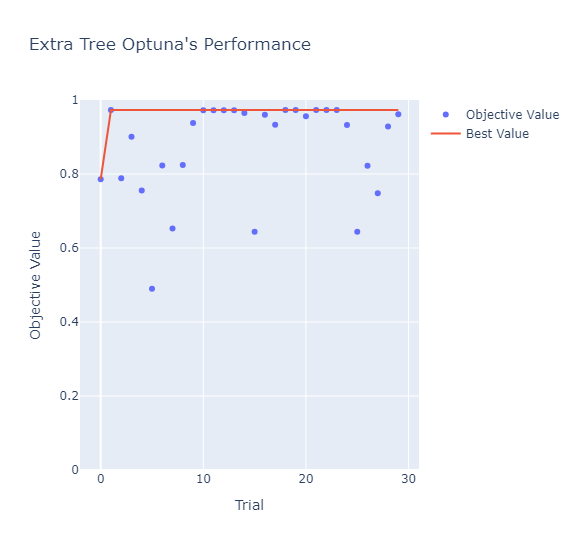

In [81]:
fig = plot_optimization_history(study_etc)
fig.update_layout(yaxis_range=[0, 1], title="Extra Tree Optuna's Performance", width=930, height=550)
fig.show()

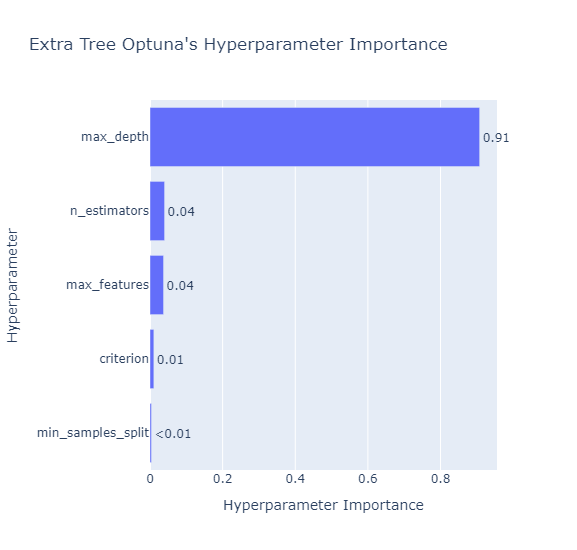

In [82]:
fig = plot_param_importances(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

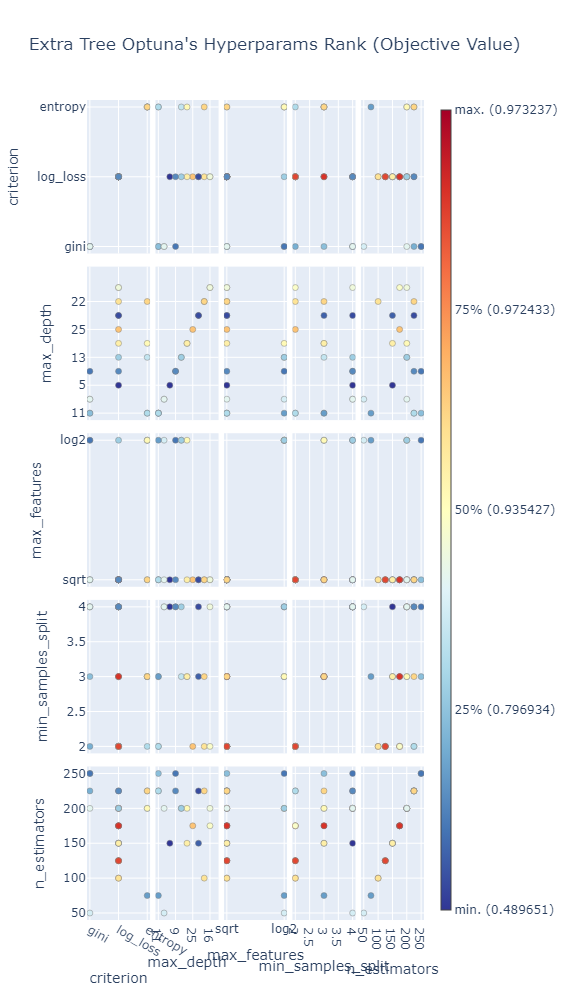

In [83]:
fig = plot_rank(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [84]:
etc_class = ExtraTreesClassifier(**study_etc.best_trial.params)
etc_class.fit(X_train, y_train)

ExtraTreesClassifier(criterion='log_loss', min_samples_split=4,
                     n_estimators=200)

In [85]:
etc_class.score(X_test, y_test)

0.9756943215991509

In [86]:
print(classification_report(y_test, etc_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.97      0.97      0.97      4317
                         CLASS II WORDS RELATING TO SPACE       0.99      0.97      0.98      3819
                       CLASS III WORDS RELATING TO MATTER       0.96      0.98      0.97      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.98      0.98      0.98      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.97      0.98      0.98      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.98      0.98      0.98      5756

                                                 accuracy                           0.98     28265
                                                macro avg       0.98      0.97      0.98     28265
                                             weighted avg       0.98      0.98      0.98     28265



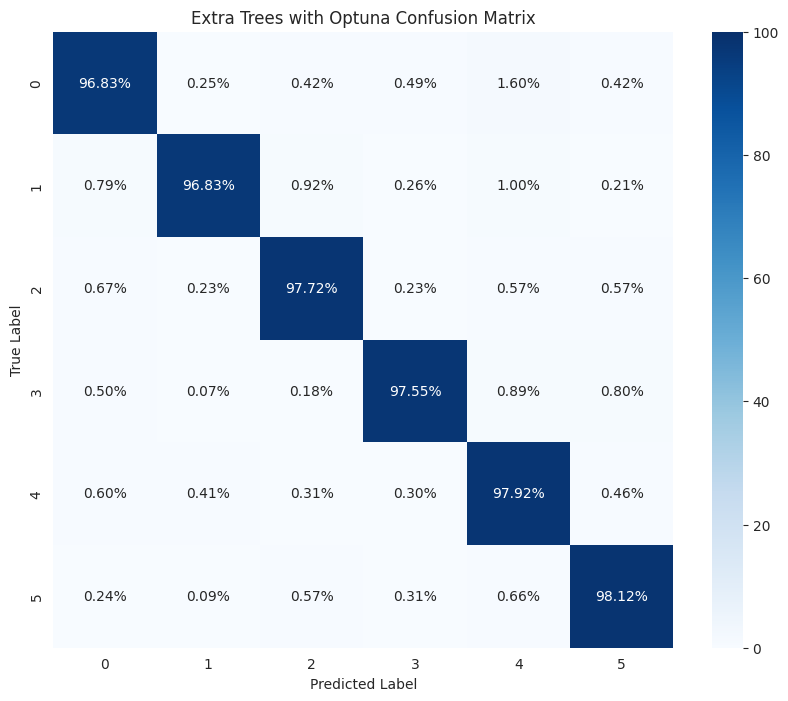

In [87]:
hf.confusion_matrix_plot(y_test, etc_class.predict(X_test), 'Extra Trees with Optuna', 'Class/ExtraTrees_cm_optuna')

### XGBoost

In [88]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit the encoder to the class labels and transform them to numeric labels
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.fit_transform(y_test)

In [89]:
xgboost = XGBClassifier(use_label_encoder=False, n_jobs=-1, random_state=33)
xgboost.fit(X_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [90]:
xgboost.score(X_test, y_test_encoded)

0.9761188749336636

In [91]:
print(classification_report(y_test_encoded, xgboost.predict(X_test)))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      4317
           1       0.98      0.97      0.98      3819
           2       0.97      0.97      0.97      2980
           3       0.98      0.98      0.98      4365
           4       0.97      0.98      0.97      7028
           5       0.98      0.98      0.98      5756

    accuracy                           0.98     28265
   macro avg       0.98      0.98      0.98     28265
weighted avg       0.98      0.98      0.98     28265



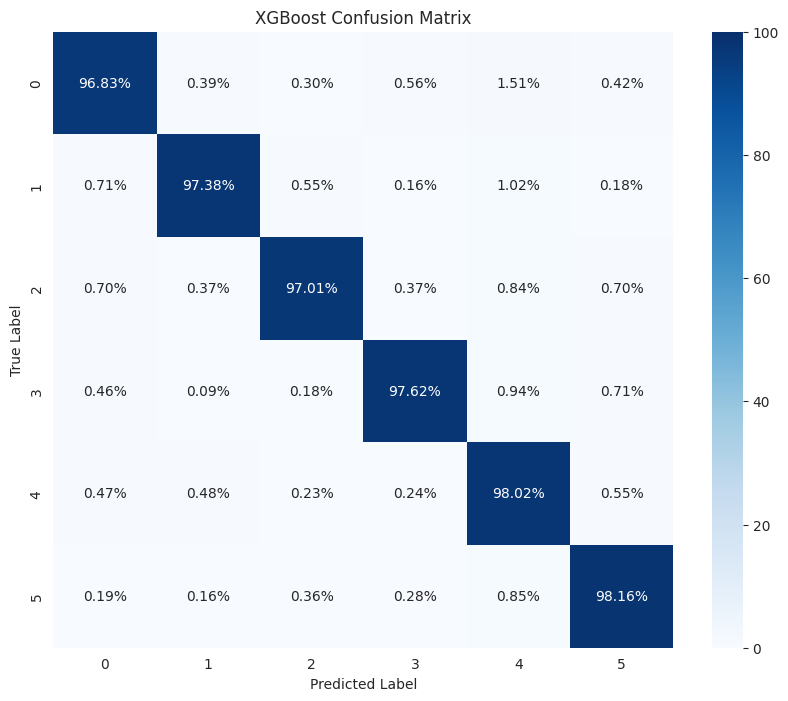

In [92]:
hf.confusion_matrix_plot(y_test_encoded, xgboost.predict(X_test), 'XGBoost', 'Class/XGBoost_cm')

In [93]:
def objective_xgb_class(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.1, 10),
        'subsample': trial.suggest_float('subsample', 0.3, 0.6),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'lambda': trial.suggest_float('lambda', 0, 10),
        'alpha': trial.suggest_float('alpha', 0, 10),
        'objective': 'multi:softmax',
        'num_class': 6,
        'eval_metric': 'mlogloss',
    }
    
    xgboost = XGBClassifier(**params, n_jobs=-1, random_state=33)
    score = cross_val_score(xgboost, X_train, y_train_encoded, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [94]:
study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb_class, n_trials=20)

[I 2024-09-17 00:17:25,729] A new study created in memory with name: no-name-0eaa7a55-a45a-482d-84b6-ed31662cb041
[I 2024-09-17 00:17:58,795] Trial 0 finished with value: 0.9476110327677447 and parameters: {'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.04170175649301458, 'min_child_weight': 9, 'gamma': 0.223692806122308, 'subsample': 0.31456094847336974, 'colsample_bytree': 0.5879837753893407, 'lambda': 2.13761457631384, 'alpha': 1.5144490392078935}. Best is trial 0 with value: 0.9476110327677447.
[I 2024-09-17 00:18:54,954] Trial 1 finished with value: 0.9546316092738328 and parameters: {'n_estimators': 200, 'max_depth': 6, 'learning_rate': 0.029471332771114675, 'min_child_weight': 10, 'gamma': 5.240008971677135, 'subsample': 0.36485273946863694, 'colsample_bytree': 0.9284071629133708, 'lambda': 6.238385165425347, 'alpha': 5.041465510781964}. Best is trial 1 with value: 0.9546316092738328.
[I 2024-09-17 00:19:13,106] Trial 2 finished with value: 0.9144035542616265 and parame

In [95]:
print('Best trial:')
trial = study_xgb.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9645483631290844
Params: 
  n_estimators: 200
  max_depth: 6
  learning_rate: 0.039811332051038865
  min_child_weight: 1
  gamma: 3.3498333777740537
  subsample: 0.4720320057962567
  colsample_bytree: 0.6946716586442823
  lambda: 5.116396844950012
  alpha: 0.12010811080028105


In [96]:
trials_df = study_xgb.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,state
6,6,0.964548,2024-09-17 00:21:11.137514,2024-09-17 00:22:08.726357,0 days 00:00:57.588843,0.120108,0.694672,3.349833,5.116397,0.039811,6,1,200,0.472032,COMPLETE
12,12,0.962607,2024-09-17 00:27:09.990135,2024-09-17 00:28:32.784170,0 days 00:01:22.794035,0.937457,0.839686,5.138512,7.533235,0.025266,8,7,250,0.508562,COMPLETE
16,16,0.961667,2024-09-17 00:31:25.089774,2024-09-17 00:32:31.845758,0 days 00:01:06.755984,2.913598,0.663260,2.243626,7.418210,0.026433,10,5,150,0.419360,COMPLETE
7,7,0.960788,2024-09-17 00:22:08.728388,2024-09-17 00:23:29.485097,0 days 00:01:20.756709,4.962399,0.753894,4.699837,5.135541,0.025397,8,6,250,0.483493,COMPLETE
11,11,0.959560,2024-09-17 00:25:47.459154,2024-09-17 00:27:09.988763,0 days 00:01:22.529609,7.427544,0.644780,3.866900,3.813884,0.020366,8,7,250,0.467246,COMPLETE


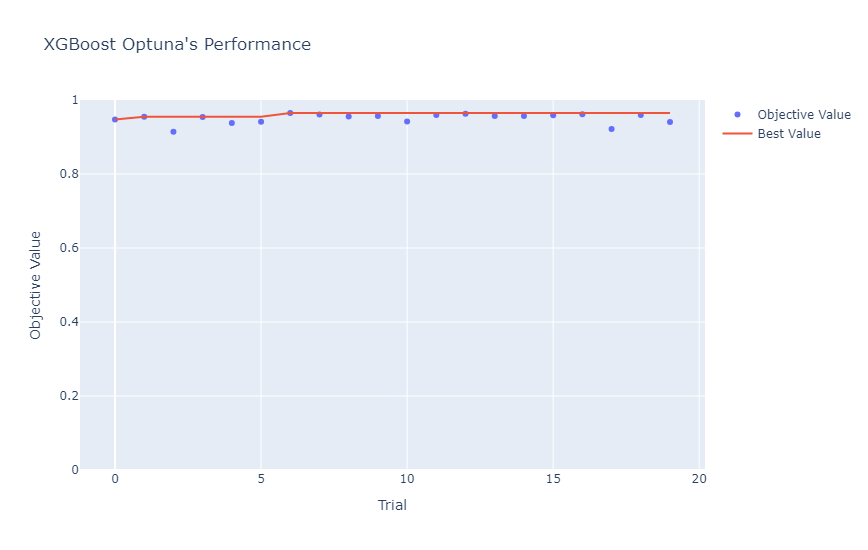

In [97]:
fig = plot_optimization_history(study_xgb)
fig.update_layout(yaxis_range=[0, 1], title="XGBoost Optuna's Performance", width=930, height=550)
fig.show()

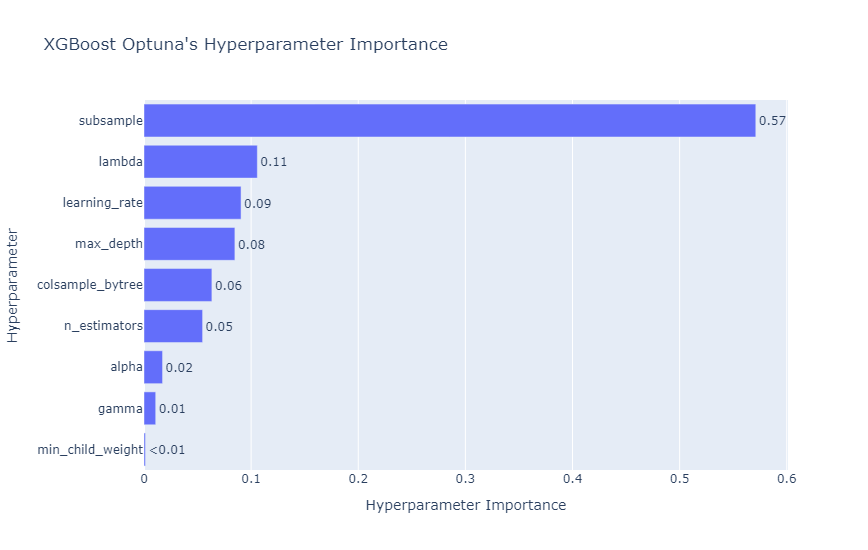

In [98]:
fig = plot_param_importances(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

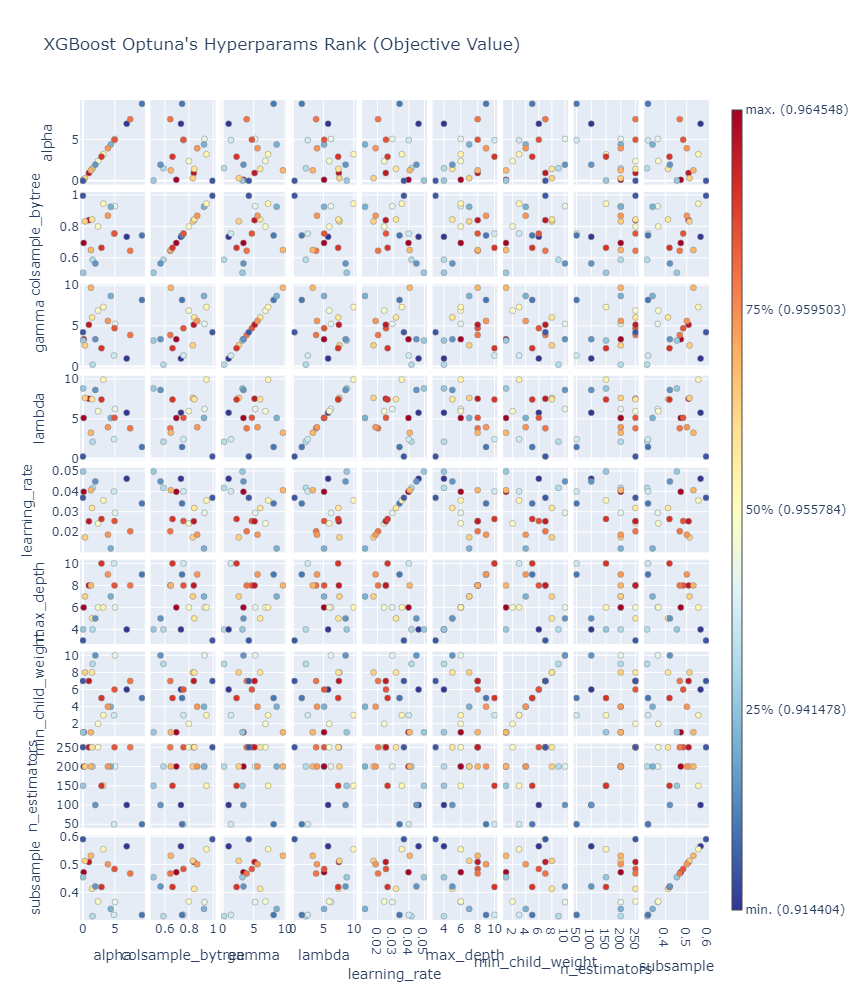

In [99]:
fig = plot_rank(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [100]:
xgboost_class = XGBClassifier(**study_xgb.best_trial.params, n_jobs=-1, random_state=33)
xgboost_class.fit(X_train, y_train_encoded)

XGBClassifier(alpha=0.12010811080028105, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6946716586442823, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=3.3498333777740537,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=5.116396844950012,
              learning_rate=0.039811332051038865, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=-1, ...)

In [101]:
xgboost_class.score(X_test, y_test_encoded)

0.9680169821333805

In [102]:
print(classification_report(y_test_encoded, xgboost_class.predict(X_test)))

              precision    recall  f1-score   support

           0       0.97      0.96      0.96      4317
           1       0.98      0.96      0.97      3819
           2       0.98      0.96      0.97      2980
           3       0.98      0.96      0.97      4365
           4       0.95      0.98      0.96      7028
           5       0.97      0.98      0.97      5756

    accuracy                           0.97     28265
   macro avg       0.97      0.97      0.97     28265
weighted avg       0.97      0.97      0.97     28265



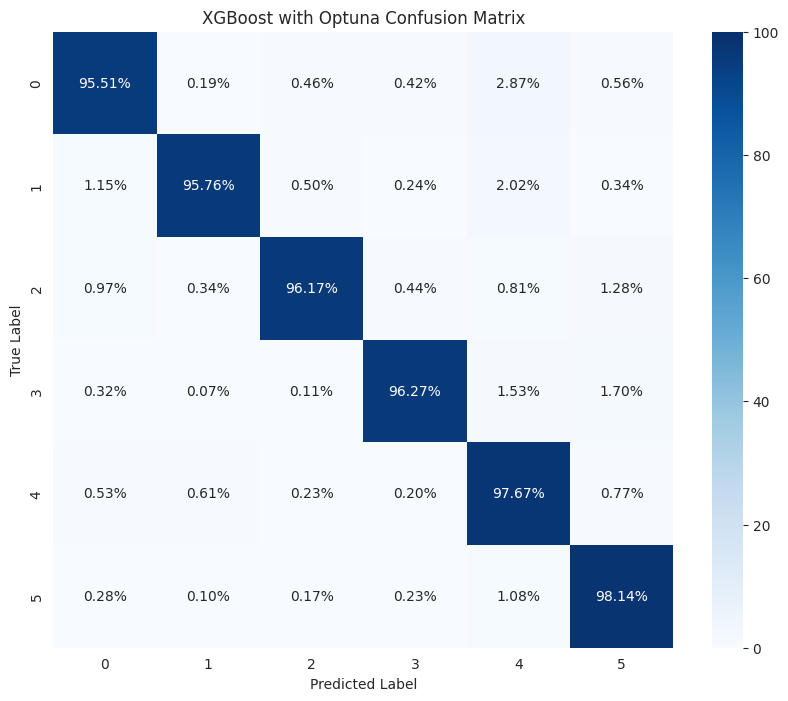

In [103]:
hf.confusion_matrix_plot(y_test_encoded, xgboost_class.predict(X_test), 'XGBoost with Optuna', 'Class/XGBoost_cm_optuna')

### LightGBM

In [104]:
lgbm = LGBMClassifier(verbose=-1)
lgbm.fit(X_train, y_train)

LGBMClassifier(verbose=-1)

In [105]:
lgbm.score(X_test, y_test)

0.9748098354855829

In [106]:
print(classification_report(y_test, lgbm.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.98      0.96      0.97      4317
                         CLASS II WORDS RELATING TO SPACE       0.98      0.97      0.98      3819
                       CLASS III WORDS RELATING TO MATTER       0.98      0.97      0.97      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.98      0.97      0.98      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.96      0.98      0.97      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.98      0.98      0.98      5756

                                                 accuracy                           0.97     28265
                                                macro avg       0.98      0.97      0.97     28265
                                             weighted avg       0.97      0.97      0.97     28265



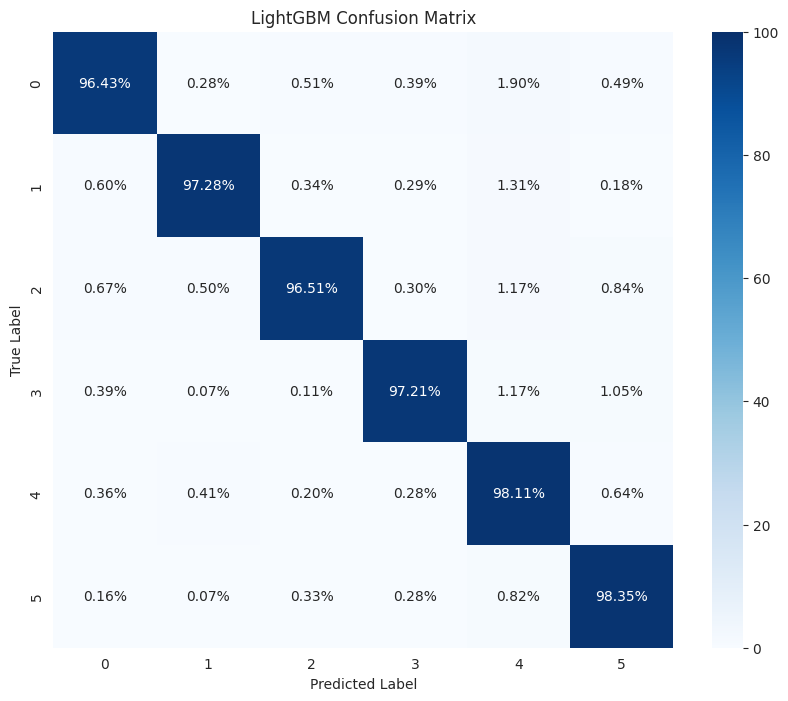

In [107]:
hf.confusion_matrix_plot(y_test, lgbm.predict(X_test), 'LightGBM', 'Class/LightGBM_cm')

In [108]:
def objective_lgbm_class(trial):
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',  # Use multi_logloss for multiclass classification
        'num_class': 6, 
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        # 'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'max_depth': trial.suggest_int('max_depth', -1, 20, 2), 
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 25),
        'subsample': trial.suggest_float('subsample', 0.2, 0.3), 
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.2, 0.3),
        # 'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 10.0),  # L1 regularization
        # 'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 10.0),  # L2 regularization
        'n_jobs': -1,
        'verbose': -1
    }

    # Create and fit the model
    lgbm = LGBMClassifier(**params)
    score = cross_val_score(lgbm, X_train, y_train, cv=2, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [109]:
study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lgbm_class, n_trials=10)

[I 2024-09-17 00:39:03,856] A new study created in memory with name: no-name-03a41b63-d214-4ddf-a708-23b46faff63a
[I 2024-09-17 00:41:11,743] Trial 0 finished with value: 0.9725696993882147 and parameters: {'n_estimators': 200, 'max_depth': 15, 'num_leaves': 135, 'min_child_samples': 9, 'subsample': 0.23573091860692863, 'colsample_bytree': 0.2792926665538147}. Best is trial 0 with value: 0.9725696993882147.
[I 2024-09-17 00:43:18,319] Trial 1 finished with value: 0.9716599137335811 and parameters: {'n_estimators': 100, 'max_depth': 15, 'num_leaves': 236, 'min_child_samples': 25, 'subsample': 0.25364379794041614, 'colsample_bytree': 0.28437463255828416}. Best is trial 0 with value: 0.9725696993882147.
[I 2024-09-17 00:45:11,351] Trial 2 finished with value: 0.9720844833154323 and parameters: {'n_estimators': 250, 'max_depth': 7, 'num_leaves': 177, 'min_child_samples': 8, 'subsample': 0.2337802354376959, 'colsample_bytree': 0.2806131084465825}. Best is trial 0 with value: 0.9725696993882

In [110]:
print('Best trial:')
trial = study_lgbm.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9725696993882147
Params: 
  n_estimators: 200
  max_depth: 15
  num_leaves: 135
  min_child_samples: 9
  subsample: 0.23573091860692863
  colsample_bytree: 0.2792926665538147


In [111]:
trials_df = study_lgbm.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_max_depth,params_min_child_samples,params_n_estimators,params_num_leaves,params_subsample,state
0,0,0.972570,2024-09-17 00:39:03.857970,2024-09-17 00:41:11.742899,0 days 00:02:07.884929,0.279293,15,9,200,135,0.235731,COMPLETE
4,4,0.972524,2024-09-17 00:45:24.604138,2024-09-17 00:48:27.814988,0 days 00:03:03.210850,0.246024,-1,15,250,288,0.288384,COMPLETE
7,7,0.972509,2024-09-17 00:49:14.785281,2024-09-17 00:51:39.744146,0 days 00:02:24.958865,0.279916,-1,17,100,237,0.213829,COMPLETE
2,2,0.972084,2024-09-17 00:43:18.320512,2024-09-17 00:45:11.351022,0 days 00:01:53.030510,0.280613,7,8,250,177,0.233780,COMPLETE
8,8,0.971796,2024-09-17 00:51:39.745510,2024-09-17 00:52:36.710075,0 days 00:00:56.964565,0.268090,7,23,150,266,0.208489,COMPLETE


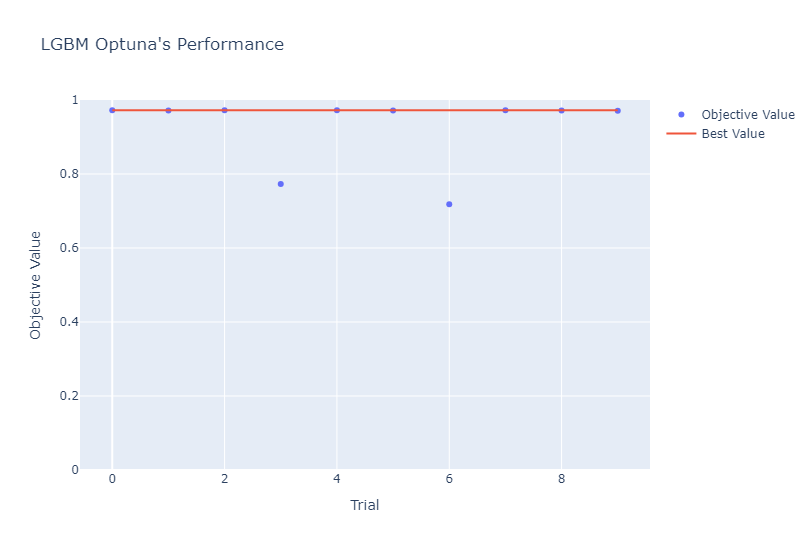

In [112]:
fig = plot_optimization_history(study_lgbm)
fig.update_layout(yaxis_range=[0, 1], title="LGBM Optuna's Performance", width=930, height=550)
fig.show()

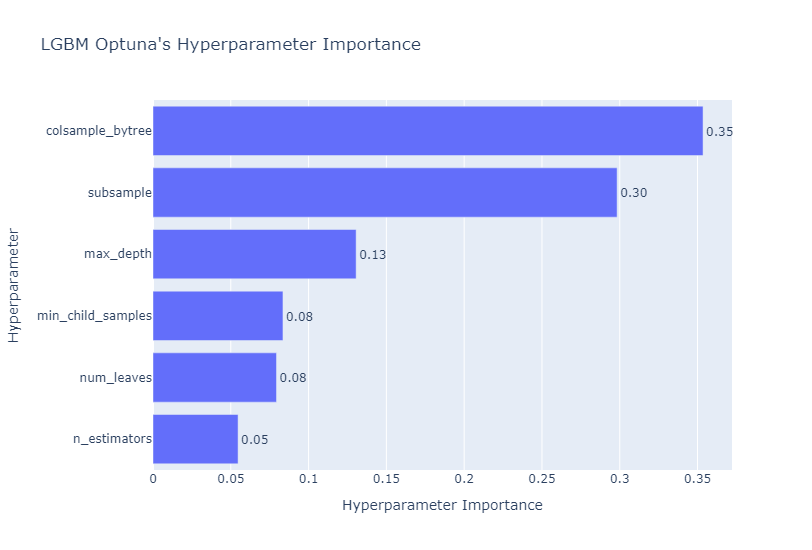

In [113]:
fig = plot_param_importances(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

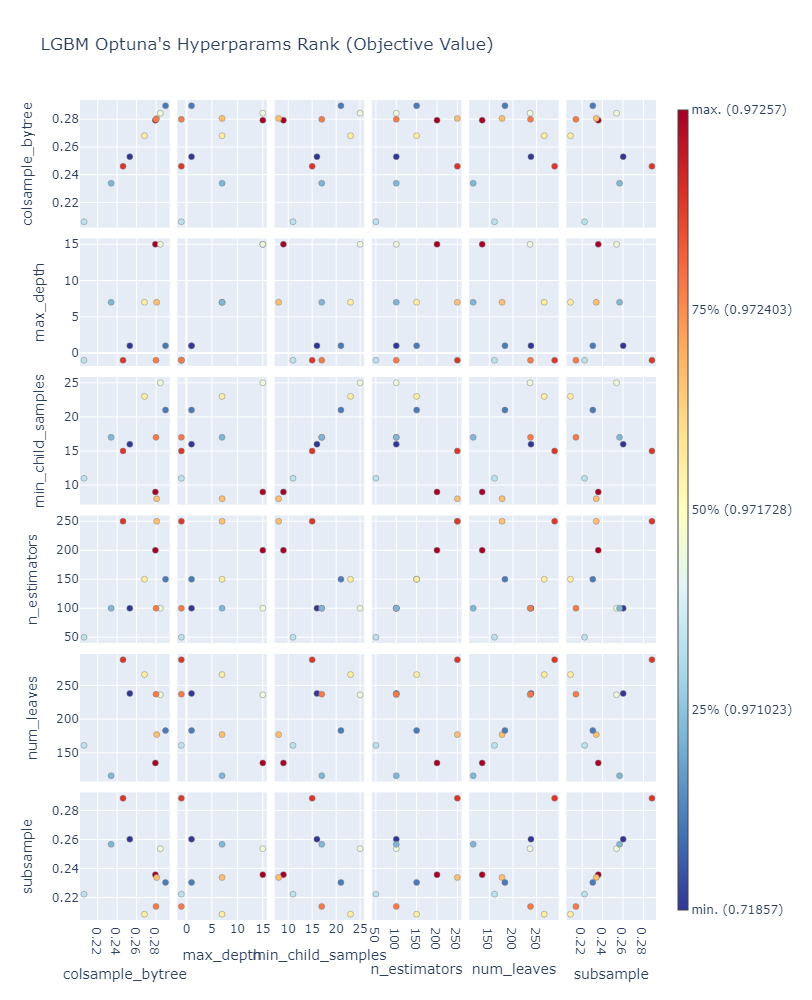

In [114]:
fig = plot_rank(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [115]:
lgbm_class = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_class.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.2792926665538147, max_depth=15,
               min_child_samples=9, n_estimators=200, num_leaves=135,
               subsample=0.23573091860692863)

In [116]:
lgbm_class.score(X_test, y_test)

0.9767557049354325

In [117]:
print(classification_report(y_test, lgbm_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.97      0.97      0.97      4317
                         CLASS II WORDS RELATING TO SPACE       0.98      0.98      0.98      3819
                       CLASS III WORDS RELATING TO MATTER       0.97      0.98      0.97      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.98      0.98      0.98      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.97      0.98      0.98      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.98      0.98      0.98      5756

                                                 accuracy                           0.98     28265
                                                macro avg       0.98      0.98      0.98     28265
                                             weighted avg       0.98      0.98      0.98     28265



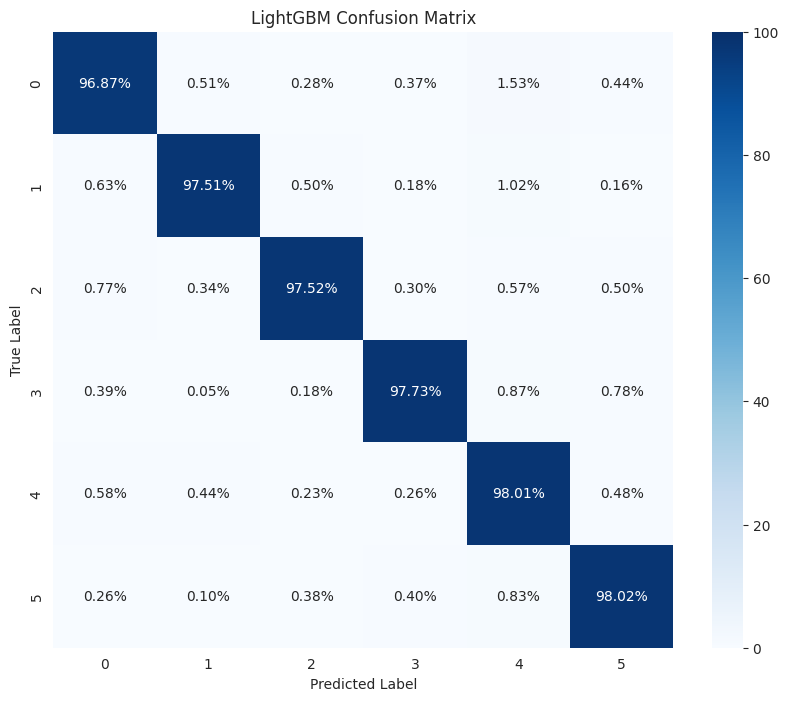

In [118]:
hf.confusion_matrix_plot(y_test, lgbm_class.predict(X_test), 'LightGBM', 'Class/LightGBM_cm_optuna')

## 5. ML Comparison

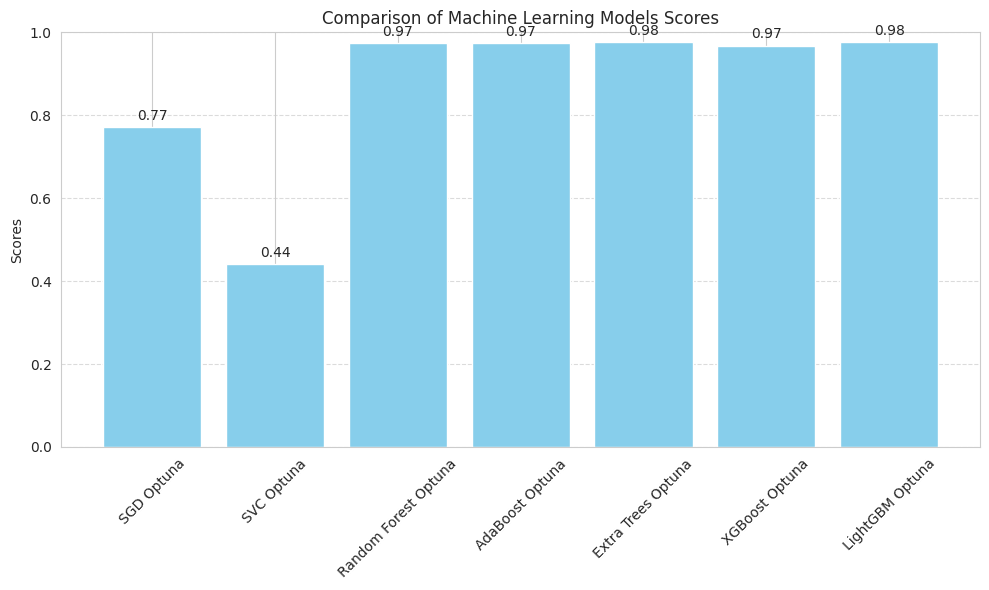

In [120]:
model_objects = {
    'SGD Optuna': sgd_class,
    'SVC Optuna': svc_class,
    'Random Forest Optuna': rf_class,
    'AdaBoost Optuna': adaboost_class,
    'Extra Trees Optuna': etc_class,
    'XGBoost Optuna': xgboost_class,
    'LightGBM Optuna': lgbm_class
}

# Extract scores for each model
model_names = []
scores = []

for model_name, model in model_objects.items():
    if model_name != 'XGBoost Optuna':
        score = model.score(X_test, y_test)
        model_names.append(model_name)
        scores.append(score)
    else:
        score = model.score(X_test, y_test_encoded)
        model_names.append(model_name)
        scores.append(score)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue')
plt.xlabel(None)
plt.ylabel('Scores')
plt.title('Comparison of Machine Learning Models Scores')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add score values on top of the bars
for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('Figures/Modeling Class/Machine_Learning_results_with_optuna.png')
plt.show()

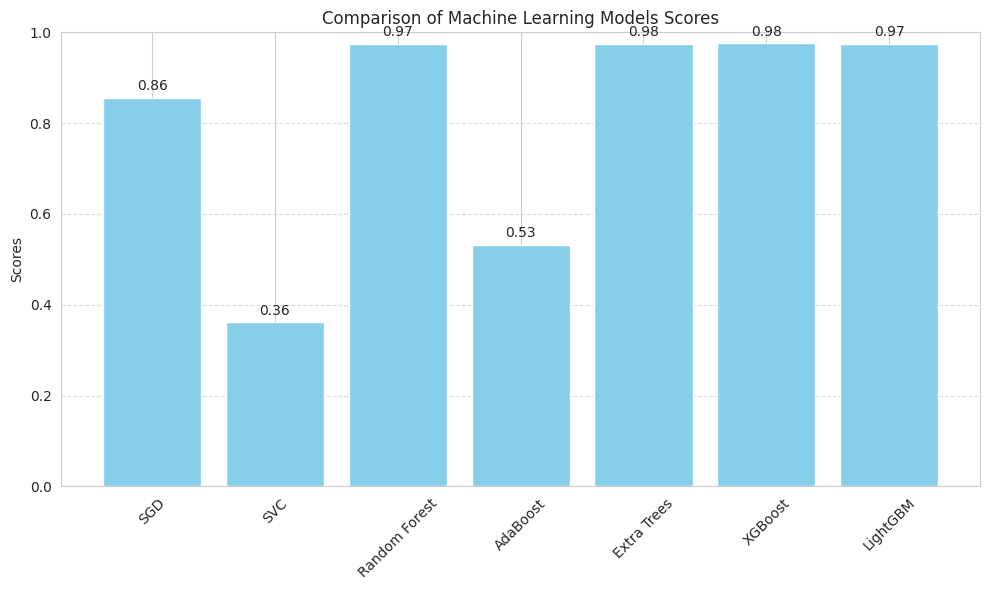

In [121]:
model_objects = {
    'SGD': sgd,
    'SVC': svc,
    'Random Forest': rf,
    'AdaBoost': adaboost,
    'Extra Trees': etc,
    'XGBoost': xgboost,
    'LightGBM': lgbm
}

# Extract scores for each model
model_names = []
scores = []

for model_name, model in model_objects.items():
    if model_name != 'XGBoost':
        score = model.score(X_test, y_test)
        model_names.append(model_name)
        scores.append(score)
    else:
        score = model.score(X_test, y_test_encoded)
        model_names.append(model_name)
        scores.append(score)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue')
plt.xlabel(None)
plt.ylabel('Scores')
plt.title('Comparison of Machine Learning Models Scores')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add score values on top of the bars
for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('Figures/Modeling Class/Machine_Learning_results.png')
plt.show()

In [122]:
dump(lgbm_class, 'Models/Class/lgbm.joblib')

['Models/Class/lgbm.joblib']

In [123]:
dump(xgboost, 'Models/Class/xgboost.joblib')

['Models/Class/xgboost.joblib']

## 6. Deep Learning

* Set up mix precision before modeling to speed up the training

In [124]:
!nvidia-smi -L

GPU 0: NVIDIA GeForce RTX 3060 (UUID: GPU-ab9b9fbd-4e42-e44a-c243-d1a9ea6686fe)


In [125]:
tf.config.list_physical_devices()

2024-09-17 01:00:27.571946: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-09-17 01:00:27.722034: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-09-17 01:00:27.722086: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [126]:
mixed_precision.set_global_policy(policy='mixed_float16')

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3060, compute capability 8.6


2024-09-17 01:00:29.312072: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


In [127]:
mixed_precision.global_policy()

<Policy "mixed_float16">

* Initialize fixed variables needed

In [128]:
# Initialize parameters for our models
embedding_dim = 300
output_dim = 6
batch_size = 33

* Encode the y datasets

In [129]:
# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Fit the label encoder and transform the labels to integer indices
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Convert integer labels to one-hot encoded labels
y_train_categorical = to_categorical(y_train_encoded, num_classes=output_dim)
y_test_categorical = to_categorical(y_test_encoded, num_classes=output_dim)

* Initialize callbacks

In [130]:
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.8, patience=3, min_lr=1e-6)

### LSTM

In [132]:
# Input layer
input_layer = Input(shape=(embedding_dim), name='Input')
reshaped_input = Reshape((1, embedding_dim), name='Reshape_Layer')(input_layer)

# First Bidirectional LSTM layer
bi_lstm_1 = Bidirectional(
                LSTM(units=64,
                     kernel_regularizer=l2(0.01),
                     recurrent_regularizer=l2(0.01),
                     return_sequences=True),
                name='Bidirectional_LSTM_1')(reshaped_input)
dropout_1 = Dropout(0.2, name='Dropout_1')(bi_lstm_1)
batch_norm_1 = BatchNormalization(name='BatchNorm_1')(dropout_1)

# Second LSTM layer with residual connection
lstm_layer_2 = LSTM(units=128,
                    kernel_regularizer=l2(0.01),
                    recurrent_regularizer=l2(0.01),
                    return_sequences=True,
                    name='LSTM_2')(batch_norm_1)
dropout_2 = Dropout(0.2, name='Dropout_2')(lstm_layer_2)
residual_1 = Add(name='Residual_1')([batch_norm_1, dropout_2])

# Third GRU layer
gru_layer = GRU(units=64, return_sequences=False, name='GRU_3')(residual_1)
dropout_3 = Dropout(0.2, name='Dropout_3')(gru_layer)
layer_norm_1 = LayerNormalization(name='LayerNorm_1')(dropout_3)

# Dense layers
dense_1 = Dense(units=64, activation='relu', name='Dense_1')(layer_norm_1)
dropout_4 = Dropout(0.2, name='Dropout_4')(dense_1)
dense_2 = Dense(units=64, activation='relu', name='Dense_2')(dropout_4)
residual_2 = Add(name='Residual_2')([dropout_4, dense_2])

# Output layer
output_layer = Dense(units=output_dim, activation='softmax', name='Output_Layer')(residual_2)

In [133]:
lstm = Model(inputs=input_layer, outputs=output_layer, name='Complex_LSTM_Model')
lstm.compile(optimizer=tf.keras.optimizers.AdamW(),
              loss=tf.keras.losses.CategoricalFocalCrossentropy(),
              metrics=['accuracy'])

In [134]:
lstm.summary()

Model: "Complex_LSTM_Model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 Input (InputLayer)          [(None, 300)]                0         []                            
                                                                                                  
 Reshape_Layer (Reshape)     (None, 1, 300)               0         ['Input[0][0]']               
                                                                                                  
 Bidirectional_LSTM_1 (Bidi  (None, 1, 128)               186880    ['Reshape_Layer[0][0]']       
 rectional)                                                                                       
                                                                                                  
 Dropout_1 (Dropout)         (None, 1, 128)               0         ['Bidirection

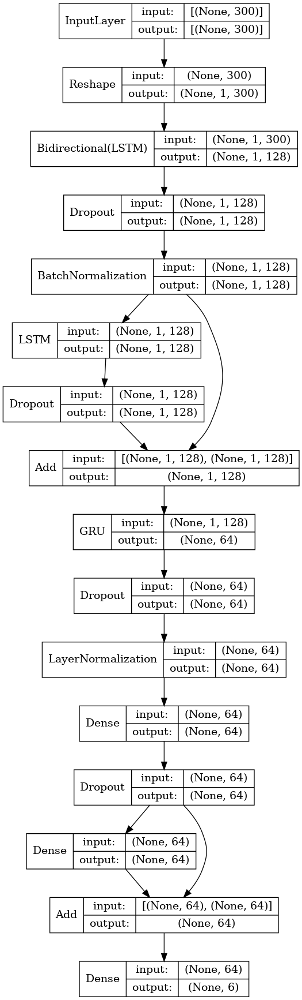

In [135]:
plot_model(lstm, to_file='Models Architecture/Bidirectional_LSTM.png', show_shapes=True, show_layer_names=False)

In [136]:
lstm_history = lstm.fit(X_train,
                        y_train_categorical,
                        epochs=50,
                        batch_size=batch_size,
                        validation_split=0.2,
                        callbacks=[reduce_lr])

Epoch 1/50


2024-09-17 01:01:35.369982: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902


   1/1599 [..............................] - ETA: 2:11:57 - loss: 10.5864 - accuracy: 0.1818

2024-09-17 01:01:37.097378: I external/local_xla/xla/service/service.cc:168] XLA service 0x7facf45689e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-09-17 01:01:37.097416: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060, Compute Capability 8.6
2024-09-17 01:01:37.125773: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1726524097.259095  140477 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1599/1599 [==============================] - 48s 27ms/step - loss: 0.5798 - accuracy: 0.3305 - val_loss: 0.2446 - val_accuracy: 0.3813 - lr: 0.0010
Epoch 2/50
1599/1599 [==============================] - 41s 26ms/step - loss: 0.2499 - accuracy: 0.3918 - val_loss: 0.3939 - val_accuracy: 0.2041 - lr: 0.0010
Epoch 3/50
1599/1599 [==============================] - 40s 25ms/step - loss: 0.2384 - accuracy: 0.3963 - val_loss: 0.2026 - val_accuracy: 0.4873 - lr: 0.0010
Epoch 4/50
1599/1599 [==============================] - 41s 25ms/step - loss: 0.2357 - accuracy: 0.4117 - val_loss: 0.3122 - val_accuracy: 0.2015 - lr: 0.0010
Epoch 5/50
1599/1599 [==============================] - 41s 26ms/step - loss: 0.2279 - accuracy: 0.4376 - val_loss: 0.4401 - val_accuracy: 0.0290 - lr: 0.0010
Epoch 6/50
1599/1599 [==============================] - 41s 26ms/step - loss: 0.2277 - accuracy: 0.4350 - val_loss: 0.5788 - val_accuracy: 0.1030 - lr: 0.0010
Epoch 7/50
1599/1599 [==============================] - 4

In [137]:
lstm.evaluate(X_test, y_test_categorical)

884/884 [==============================] - 7s 8ms/step - loss: 0.3177 - accuracy: 0.3113


[0.3176650404930115, 0.3112683594226837]

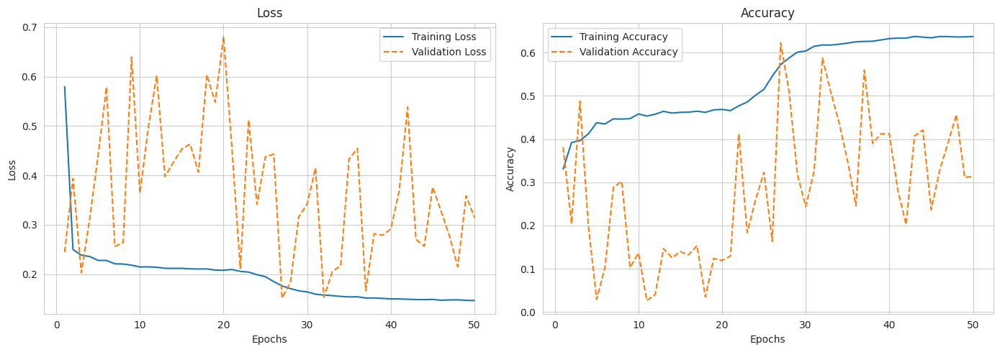

In [138]:
hf.plot_history(lstm_history, 'Modeling Class/Bidirectional_LSTM_history')

In [139]:
hf.class_report(lstm, X_test, y_test_categorical)

884/884 [==============================] - 6s 6ms/step
              precision    recall  f1-score   support

           0       0.11      0.00      0.01      4317
           1       0.07      0.01      0.01      3819
           2       0.84      0.08      0.14      2980
           3       0.24      0.97      0.39      4365
           4       0.35      0.39      0.37      7028
           5       0.68      0.26      0.38      5756

    accuracy                           0.31     28265
   macro avg       0.38      0.29      0.22     28265
weighted avg       0.38      0.31      0.25     28265



### Transformers

In [140]:
num_transformer_blocks = 3
num_heads = 4
ffn_units = 64

In [141]:
# Input
input_layer = Input(shape=(embedding_dim,), name='InputLayer')

# Expand dimensions to simulate sequence for attention
x = tf.expand_dims(input_layer, axis=1)
x = tf.cast(x, dtype=tf.float16)

# Transformer Encoder Blocks
for i in range(num_transformer_blocks):
    x = hf.transformer_block(x, num_heads, embedding_dim, ffn_units, block_name=f'Block_{i+1}')

#Remove the sequence dimension (back to original shape)
x = tf.squeeze(x, axis=1)

# Output 
output_layer = Dense(output_dim, activation='softmax', name='OutputLayer')(x)

In [142]:
# Initialize the model
transformer = Model(inputs=input_layer, outputs=output_layer, name='Transformer_Model')

# Compile the model
transformer.compile(optimizer=tf.keras.optimizers.AdamW(),
              loss=tf.keras.losses.CategoricalFocalCrossentropy(),
              metrics=['accuracy'])

In [143]:
transformer.summary()

Model: "Transformer_Model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 InputLayer (InputLayer)     [(None, 300)]                0         []                            
                                                                                                  
 tf.expand_dims (TFOpLambda  (None, 1, 300)               0         ['InputLayer[0][0]']          
 )                                                                                                
                                                                                                  
 tf.cast (TFOpLambda)        (None, 1, 300)               0         ['tf.expand_dims[0][0]']      
                                                                                                  
 MultiHeadAttention_Block_1  (None, 1, 300)               1443900   ['tf.cast[0][0

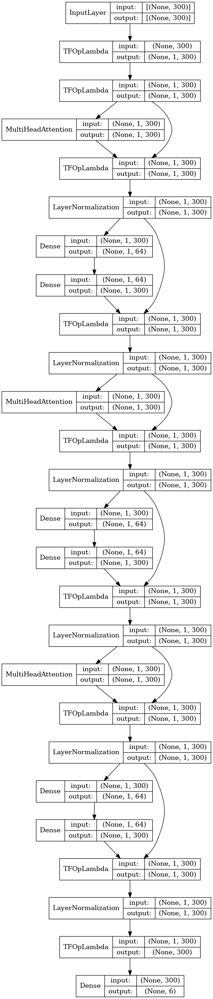

In [144]:
plot_model(transformer, to_file='Models Architecture/Transformer.png', show_shapes=True, show_layer_names=False)

In [145]:
transformer_history = transformer.fit(X_train,
                                      y_train_categorical,
                                      epochs=20,
                                      batch_size=batch_size,
                                      validation_split=0.2,
                                      callbacks=[reduce_lr])

Epoch 1/20
1599/1599 [==============================] - 50s 28ms/step - loss: 0.8662 - accuracy: 0.2457 - val_loss: 0.8588 - val_accuracy: 0.2494 - lr: 0.0010
Epoch 2/20
1599/1599 [==============================] - 45s 28ms/step - loss: 0.8623 - accuracy: 0.2463 - val_loss: 0.8588 - val_accuracy: 0.2494 - lr: 0.0010
Epoch 3/20
1599/1599 [==============================] - 46s 29ms/step - loss: 0.8623 - accuracy: 0.2463 - val_loss: 0.8588 - val_accuracy: 0.2494 - lr: 0.0010
Epoch 4/20
1599/1599 [==============================] - 46s 29ms/step - loss: 0.8623 - accuracy: 0.2463 - val_loss: 0.8588 - val_accuracy: 0.2494 - lr: 0.0010
Epoch 5/20
1599/1599 [==============================] - 44s 28ms/step - loss: 0.8623 - accuracy: 0.2463 - val_loss: 0.8588 - val_accuracy: 0.2494 - lr: 8.0000e-04
Epoch 6/20
1599/1599 [==============================] - 45s 28ms/step - loss: 0.8623 - accuracy: 0.2463 - val_loss: 0.8588 - val_accuracy: 0.2494 - lr: 8.0000e-04
Epoch 7/20
1599/1599 [================

In [146]:
transformer.evaluate(X_test, y_test_categorical)

884/884 [==============================] - 10s 11ms/step - loss: 0.8654 - accuracy: 0.2486


[0.8654122352600098, 0.24864673614501953]

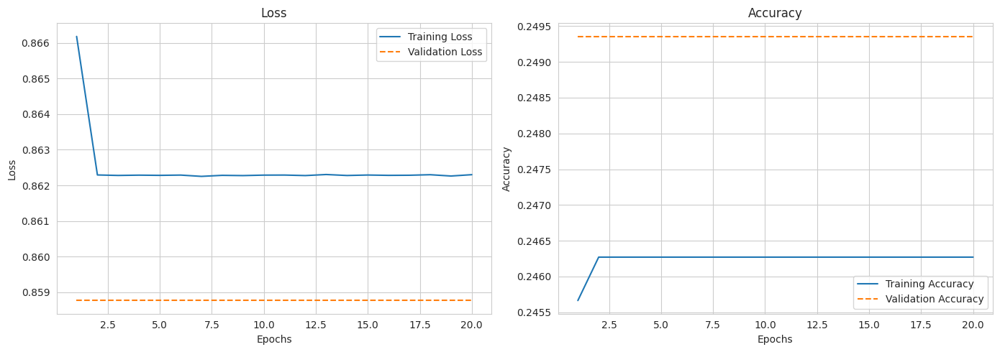

In [147]:
hf.plot_history(transformer_history, 'Modeling Class/Transformer_history')

In [148]:
hf.class_report(transformer, X_test, y_test_categorical)

884/884 [==============================] - 8s 9ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4317
           1       0.00      0.00      0.00      3819
           2       0.00      0.00      0.00      2980
           3       0.00      0.00      0.00      4365
           4       0.25      1.00      0.40      7028
           5       0.00      0.00      0.00      5756

    accuracy                           0.25     28265
   macro avg       0.04      0.17      0.07     28265
weighted avg       0.06      0.25      0.10     28265

